# Support Vector Machine (SVC) and (SVR)

What category of algorithms does Support Vector Machines classification belong to?
Support Vector Machines (SVMs) are most frequently used for solving classification problems, which fall under the supervised machine learning category.

https://towardsdatascience.com/svm-classifier-and-rbf-kernel-how-to-make-better-models-in-python-73bb4914af5b

Also, with small adaptations, SVMs can also be used for regression through the use of the Support Vector Regression algorithm (SVR).

Note, the algorithm allows you to control how much you care about misclassifications (and points inside the margin) by adjusting the hyperparameter C. Essentially, C acts as a weight assigned to ξ. A low C makes the decision surface smooth (more robust), while a high C aims at classifying all training examples correctly, producing a closer fit to the training data but making it less robust.

Beware, while setting a high value for C is likely to lead to a better model performance on the training data, there is a high risk of overfitting the model, producing poor results on the test data.

Before introducing gamma parameter, we need to talk about kernel trick. In some cases, data points that are not linearly separable are transformed using kernel functions so that they become linearly separable. Kernel function is kind of a similarity measure. The inputs are original features and the output is a similarity measure in the new feature space. Similarity here means a degree of closeness. It is a costly operation to actually transform data points to a high-dimensional feature space. The algorithm does not actually transform the data points to a new, high dimensional feature space. Kernelized SVM compute decision boundaries in terms of similarity measures in a high-dimensional feature space without actually doing a transformation. I think this is why it is also called kernel trick.

When we increase the C value, the margin gets smaller. Thus, the models with low C values tend to be more generalized. The difference becomes clearer with larger datasets.

Gamma is a hyperparameter used with non-linear SVM. One of the most commonly used non-linear kernels is the radial basis function (RBF). Gamma parameter of RBF controls the distance of the influence of a single training point.

Low values of gamma indicate a large similarity radius which results in more points being grouped together. For high values of gamma, the points need to be very close to each other in order to be considered in the same group (or class).

It is very significant to remember for SVM that the input data need to be normalized so that features are on the same scale and compatible.

Typical values for c and gamma are as follows. However, specific optimal values may exist depending on the application:
0.0001 < gamma < 10
0.1 < c < 100

In [1]:
import pandas as pd # for data manipulation
import numpy as np # for data manipulation

from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn.svm import SVC # for Support Vector Classification model

import plotly.express as px  # for data visualization
import plotly.graph_objects as go # for data visualization

In [2]:
# Read in the csv
df=pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/games.csv', encoding='utf-8')
df

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.504110e+12,1.504110e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.504030e+12,1.504030e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,1.499791e+12,1.499791e+12,24,resign,white,10+10,belcolt,1691,jamboger,1220,d4 f5 e3 e6 Nf3 Nf6 Nc3 b6 Be2 Bb7 O-O Be7 Ne5...,A80,Dutch Defense,2
20054,WSJDhbPl,True,1.499698e+12,1.499699e+12,82,mate,black,10+0,jamboger,1233,farrukhasomiddinov,1196,d4 d6 Bf4 e5 Bg3 Nf6 e3 exd4 exd4 d5 c3 Bd6 Bd...,A41,Queen's Pawn,2
20055,yrAas0Kj,True,1.499698e+12,1.499698e+12,35,mate,white,10+0,jamboger,1219,schaaksmurf3,1286,d4 d5 Bf4 Nc6 e3 Nf6 c3 e6 Nf3 Be7 Bd3 O-O Nbd...,D00,Queen's Pawn Game: Mason Attack,3
20056,b0v4tRyF,True,1.499696e+12,1.499697e+12,109,resign,white,10+0,marcodisogno,1360,jamboger,1227,e4 d6 d4 Nf6 e5 dxe5 dxe5 Qxd1+ Kxd1 Nd5 c4 Nb...,B07,Pirc Defense,4


In [3]:
# Difference between white rating and black rating - independent variable
df['rating_difference']=df['white_rating']-df['black_rating']

In [4]:
# White wins flag (1=win vs. 0=not-win) - dependent (target) variable
df['white_win']=df['winner'].apply(lambda x: 1 if x=='white' else 0)

In [5]:
# Print a snapshot of a few columns
df.iloc[:,[0,1,5,6,8]]

,id,rated,victory_status,winner,white_id
0,TZJHLljE,False,outoftime,white,bourgris
1,l1NXvwaE,True,resign,black,a-00
2,mIICvQHh,True,mate,white,ischia
3,kWKvrqYL,True,mate,white,daniamurashov
4,9tXo1AUZ,True,mate,white,nik221107
...,...,...,...,...,...
20053,EfqH7VVH,True,resign,white,belcolt
20054,WSJDhbPl,True,mate,black,jamboger
20055,yrAas0Kj,True,mate,white,jamboger
20056,b0v4tRyF,True,resign,white,marcodisogno


In [6]:
# Select data for modeling
X=df[['rating_difference', 'turns']]
y=df['white_win'].values

In [7]:
# Create training and testing samples
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Gamma is a scalar that defines how much influence a single training example (point) has. 

So, given the above setup, we can control individual points' influence on the overall algorithm. The larger gamma is, the closer other points must be to affect the model. We will see the impact of changing gamma in the below Python examples.

In [8]:
# Fit the model
#Note, available kernels: {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’}, default=’rbf’
model = SVC(kernel='rbf', probability=True, C=1, gamma='scale')
clf = model.fit(X_train, y_train)

In [9]:
model

SVC(C=1, probability=True)

In [10]:
clf

SVC(C=1, probability=True)

In [11]:
# Predict class labels on training data
pred_labels_tr = model.predict(X_train)
# Predict class labels on a test data
pred_labels_te = model.predict(X_test)

In [12]:
# Use score method to get accuracy of the model
print('----- Evaluation on Test Data -----')
score_te = model.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))
print('--------------------------------------------------------')

----- Evaluation on Test Data -----
Accuracy Score:  0.6530408773678963
              precision    recall  f1-score   support

           0       0.64      0.70      0.67      2024
           1       0.66      0.60      0.63      1988

    accuracy                           0.65      4012
   macro avg       0.65      0.65      0.65      4012
weighted avg       0.65      0.65      0.65      4012

--------------------------------------------------------


In [13]:
print('----- Evaluation on Training Data -----')
score_tr = model.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))
print('--------------------------------------------------------')

----- Evaluation on Training Data -----
Accuracy Score:  0.6468901907017325
              precision    recall  f1-score   support

           0       0.64      0.68      0.66      8033
           1       0.66      0.62      0.64      8013

    accuracy                           0.65     16046
   macro avg       0.65      0.65      0.65     16046
weighted avg       0.65      0.65      0.65     16046

--------------------------------------------------------


We can see that the model performance on test data is similar to that on training data, which gives reassurance that the model can generalize well using the default hyperparameters.

In [14]:
def Plot_3D(X, X_test, y_test, clf):
            
    # Specify a size of the mesh to be used
    mesh_size = 5
    margin = 1

    # Create a mesh grid on which we will run our model
    x_min, x_max = X.iloc[:, 0].fillna(X.mean()).min() - margin, X.iloc[:, 0].fillna(X.mean()).max() + margin
    y_min, y_max = X.iloc[:, 1].fillna(X.mean()).min() - margin, X.iloc[:, 1].fillna(X.mean()).max() + margin
    xrange = np.arange(x_min, x_max, mesh_size)
    yrange = np.arange(y_min, y_max, mesh_size)
    xx, yy = np.meshgrid(xrange, yrange)
            
    # Calculate predictions on grid
    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
    Z = Z.reshape(xx.shape)

    # Create a 3D scatter plot with predictions
    fig = px.scatter_3d(x=X_test['rating_difference'], y=X_test['turns'], z=y_test, 
                     opacity=0.8, color_discrete_sequence=['black'])

    # Set figure title and colors
    fig.update_layout(#title_text="Scatter 3D Plot with SVM Prediction Surface",
                      paper_bgcolor = 'white',
                      scene = dict(xaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0'),
                                   yaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0'
                                              ),
                                   zaxis=dict(backgroundcolor='lightgrey',
                                              color='black', 
                                              gridcolor='#f0f0f0', 
                                              )))
    # Update marker size
    fig.update_traces(marker=dict(size=1))

    # Add prediction plane
    fig.add_traces(go.Surface(x=xrange, y=yrange, z=Z, name='SVM Prediction',
                              colorscale='RdBu', showscale=False, 
                              contours = {"z": {"show": True, "start": 0.2, "end": 0.8, "size": 0.05}}))
    fig.show()

In [16]:
Plot_3D(X, X_test, y_test, clf)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



Note, black points at the top are actual class=1 (white won), and the ones at the bottom are actual class=0 (white did not win). Meanwhile, the surface is the probability of a white win produced by the model.

While there is local variation in the probability, the decision boundary lies around x=0 (i.e., rating difference=0) since this is where the probability crosses the p=0.5 boundary.

In [17]:
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 
              'gamma': [0.0001, 0.001, 0.01, 1,5, 10, 100, 1000],
              'kernel': ['rbf']} 
#5 folders for the cross validation. Default.  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 56 candidates, totalling 280 fits
[CV 1/5] END .C=0.001, gamma=0.0001, kernel=rbf;, score=0.601 total time=  13.2s
[CV 2/5] END .C=0.001, gamma=0.0001, kernel=rbf;, score=0.606 total time=  13.4s
[CV 3/5] END .C=0.001, gamma=0.0001, kernel=rbf;, score=0.599 total time=  14.5s
[CV 4/5] END .C=0.001, gamma=0.0001, kernel=rbf;, score=0.610 total time=  13.4s
[CV 5/5] END .C=0.001, gamma=0.0001, kernel=rbf;, score=0.600 total time=  13.3s
[CV 1/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.501 total time=  15.0s
[CV 2/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.501 total time=  13.7s
[CV 3/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.501 total time=  13.3s
[CV 4/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.500 total time=  13.1s
[CV 5/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.500 total time=  13.8s
[CV 1/5] END ...C=0.001, gamma=0.01, kernel=rbf;, score=0.501 total time=  19.0s
[CV 2/5] END ...C=0.001, gamma=0.01, kernel=rbf

[CV 2/5] END ........C=0.1, gamma=5, kernel=rbf;, score=0.501 total time=  19.3s
[CV 3/5] END ........C=0.1, gamma=5, kernel=rbf;, score=0.501 total time=  19.5s
[CV 4/5] END ........C=0.1, gamma=5, kernel=rbf;, score=0.500 total time=  20.8s
[CV 5/5] END ........C=0.1, gamma=5, kernel=rbf;, score=0.500 total time=  18.2s
[CV 1/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.501 total time=  21.3s
[CV 2/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.501 total time=  22.8s
[CV 3/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.501 total time=  19.3s
[CV 4/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.500 total time=  24.7s
[CV 5/5] END .......C=0.1, gamma=10, kernel=rbf;, score=0.500 total time=  21.2s
[CV 1/5] END ......C=0.1, gamma=100, kernel=rbf;, score=0.501 total time=  19.3s
[CV 2/5] END ......C=0.1, gamma=100, kernel=rbf;, score=0.501 total time=  19.2s
[CV 3/5] END ......C=0.1, gamma=100, kernel=rbf;, score=0.501 total time=  21.5s
[CV 4/5] END ......C=0.1, ga

[CV 4/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.644 total time= 1.9min
[CV 5/5] END ...C=100, gamma=0.0001, kernel=rbf;, score=0.637 total time= 1.7min
[CV 1/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.641 total time= 2.1min
[CV 2/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.651 total time= 2.2min
[CV 3/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.632 total time= 2.0min
[CV 4/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.645 total time= 1.9min
[CV 5/5] END ....C=100, gamma=0.001, kernel=rbf;, score=0.638 total time= 2.1min
[CV 1/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.588 total time=  52.6s
[CV 2/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.588 total time=  47.1s
[CV 3/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.594 total time=  45.2s
[CV 4/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.592 total time=  48.7s
[CV 5/5] END .....C=100, gamma=0.01, kernel=rbf;, score=0.597 total time=  44.5s
[CV 1/5] END ........C=100, 

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'gamma': [0.0001, 0.001, 0.01, 1, 5, 10, 100, 1000],
                         'kernel': ['rbf']},
             verbose=3)

In [21]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 0.1, 'gamma': 0.0001, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.0001)


In [22]:
grid_predictions = grid.predict(X_test)
  
# print classification report
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.64      0.71      0.67      2024
           1       0.67      0.60      0.63      1988

    accuracy                           0.66      4012
   macro avg       0.66      0.66      0.65      4012
weighted avg       0.66      0.66      0.65      4012



In [23]:
# Predict class labels on training data
grid_predictions_tr = grid.predict(X_train)

In [24]:
#print classification report
print(classification_report(y_train, grid_predictions_tr))

              precision    recall  f1-score   support

           0       0.64      0.68      0.66      8033
           1       0.66      0.61      0.63      8013

    accuracy                           0.65     16046
   macro avg       0.65      0.65      0.65     16046
weighted avg       0.65      0.65      0.65     16046



# Note that even with parameters optimization the score are not giving good results. This may be because the features we have chosen to make predictions are not enough to give better scores, X=df[['rating_difference', 'turns']] or they are not correlated with the dependent variable in this case y=df['white_win'].values

# SVM model 2 — Gamma = 0.1

Let’s now see what happens when we set a relatively high value for gamma.

In [26]:
# Fit the model
#Note, available kernels: {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’}, default=’rbf’
model = SVC(kernel='rbf', probability=True, C=1, gamma=0.1)
clf = model.fit(X_train, y_train)

In [27]:
# Predict class labels on training data
pred_labels_tr = clf.predict(X_train)
# Predict class labels on a test data
pred_labels_te = clf.predict(X_test)

In [28]:
# Use score method to get accuracy of the model
print('----- Evaluation on Test Data -----')
score_te = model.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))
print('--------------------------------------------------------')

----- Evaluation on Test Data -----
Accuracy Score:  0.603938185443669
              precision    recall  f1-score   support

           0       0.60      0.64      0.62      2024
           1       0.61      0.57      0.59      1988

    accuracy                           0.60      4012
   macro avg       0.60      0.60      0.60      4012
weighted avg       0.60      0.60      0.60      4012

--------------------------------------------------------


In [29]:
print('----- Evaluation on Training Data -----')
score_tr = model.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))
print('--------------------------------------------------------')

----- Evaluation on Training Data -----
Accuracy Score:  0.8003240683036271
              precision    recall  f1-score   support

           0       0.80      0.81      0.80      8033
           1       0.80      0.80      0.80      8013

    accuracy                           0.80     16046
   macro avg       0.80      0.80      0.80     16046
weighted avg       0.80      0.80      0.80     16046

--------------------------------------------------------


We can see that increasing gamma has led to better model performance on training data but worse performance on test data. The below graph helps us see exactly why that is.

In [30]:
# Plot 3D chart
Plot_3D(X, X_test, y_test, clf)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



Instead of having a smooth prediction surface like before, we now have a very “spiky” one. To understand why this happens, we need to study the kernel function a bit closer.

When we choose high gamma, we tell the function that the near points are much more important for the prediction than points further away. Hence, we get these “spikes” as the prediction largely depends on individual points of the training examples rather than what is around them.

On the opposite side, reducing gamma tells the function that it’s not just the individual point but also the points around it that matter when making the prediction. To verify this, let’s look at another example with a relatively low value for gamma.

# SVM model 3— Gamma = 0.000001

In [35]:
# Fit the model
#Note, available kernels: {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’}, default=’rbf’
model = SVC(kernel='rbf', probability=True, C=1, gamma=0.000001)
clf = model.fit(X_train, y_train)

In [37]:
# Predict class labels on training data
pred_labels_tr = clf.predict(X_train)
# Predict class labels on a test data
pred_labels_te = clf.predict(X_test)

In [38]:
# Use score method to get accuracy of the model
print('----- Evaluation on Test Data -----')
score_te = model.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))
print('--------------------------------------------------------')

----- Evaluation on Test Data -----
Accuracy Score:  0.6602691924227319
              precision    recall  f1-score   support

           0       0.65      0.70      0.68      2024
           1       0.67      0.62      0.64      1988

    accuracy                           0.66      4012
   macro avg       0.66      0.66      0.66      4012
weighted avg       0.66      0.66      0.66      4012

--------------------------------------------------------


In [39]:
print('----- Evaluation on Training Data -----')
score_tr = model.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))
print('--------------------------------------------------------')

----- Evaluation on Training Data -----
Accuracy Score:  0.6463916240807678
              precision    recall  f1-score   support

           0       0.64      0.67      0.65      8033
           1       0.65      0.62      0.64      8013

    accuracy                           0.65     16046
   macro avg       0.65      0.65      0.65     16046
weighted avg       0.65      0.65      0.65     16046

--------------------------------------------------------


As expected, reducing gamma made the model more robust with an increase in model performance on the test data (accuracy = 0.66). The below graph illustrates how much smoother the prediction surface has become after assigning more influence to the points further away.

In [40]:
# Plot 3D chart
Plot_3D(X, X_test, y_test, clf)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



form the chart we can X that x = 0 is the decision boundary where the probability is around 0.5

SVMs are different from other classification algorithms because of the way they choose the decision boundary that maximizes the distance from the nearest data points of all the classes. The decision boundary created by SVMs is called the maximum margin classifier or the maximum margin hyperplane.

the parameters we have considered for tuning are for kernel 'rbf': C and gamma.

Here gamma is a parameter, which ranges from 0 to 1. A higher value of gamma will perfectly fit the training dataset, which causes over-fitting. Gamma=0.1 is considered to be a good default value. The value of gamma needs to be manually specified in the learning algorithm.

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [42]:
dataset = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/dataset.csv')

In [43]:
X = dataset.iloc[:, :-1].values
y = dataset.iloc[:, -1].values

In [44]:
y

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1,

In [45]:
from sklearn.model_selection import train_test_split
XTrain, XTest, yTrain, yTest = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [46]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
XTrain = sc.fit_transform(XTrain)
XTest = sc.transform(XTest)

In [47]:
# training the kernel SVM model
from sklearn.svm import SVC # import SVC model
classifier = SVC(kernel = 'rbf', random_state = 0, C=1, gamma=1) # creat model's object
svm = classifier.fit(XTrain, yTrain) # fits the model to the training data

In [48]:
# predicting the test set 
y_predict = classifier.predict(XTest)

In [49]:
from sklearn.metrics import confusion_matrix, accuracy_score
con_matrx = confusion_matrix(yTest, y_predict)
print(con_matrx)
accuracy_score(yTest, y_predict) 

[[64  4]
 [ 3 29]]


0.93

In [50]:
grid_predictions = grid.predict(XTest)
  
# print classification report
print(classification_report(yTest, y_predict))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95        68
           1       0.88      0.91      0.89        32

    accuracy                           0.93       100
   macro avg       0.92      0.92      0.92       100
weighted avg       0.93      0.93      0.93       100



C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



In [53]:
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
  
cancer = load_breast_cancer()
  
# The data set is presented in a dictionary form:
print(cancer.keys())

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])


In [54]:
df_feat = pd.DataFrame(cancer['data'],
                       columns = cancer['feature_names'])
df_feat

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [55]:
# cancer column is our target
df_target = pd.DataFrame(cancer['target'], 
                     columns =['Cancer'])
df_target

,Cancer
0,0
1,0
2,0
3,0
4,0
...,...
564,0
565,0
566,0
567,0


In [56]:
print("Feature Variables: ")
print(df_feat.info())

Feature Variables: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smooth

In [58]:
print(df_feat.shape)
print(df_target.shape)

(569, 30)
(569, 1)


In [59]:
np.ravel(df_target)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [61]:
from sklearn.model_selection import train_test_split
  
X_train, X_test, y_train, y_test = train_test_split(
                        df_feat, np.ravel(df_target),
                test_size = 0.30, random_state = 42)

In [62]:
# train the model on train set
model = SVC()
model.fit(X_train, y_train)
  
# print prediction results
predictions = model.predict(X_test)
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       1.00      0.83      0.90        63
           1       0.91      1.00      0.95       108

    accuracy                           0.94       171
   macro avg       0.95      0.91      0.93       171
weighted avg       0.94      0.94      0.93       171



In [88]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score

In [82]:
# Read dataset
df_net = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Social_Network_Ads.csv')
df_net.head()

,User ID,Gender,Age,EstimatedSalary,Purchased
0,15624510,Male,19,19000,0
1,15810944,Male,35,20000,0
2,15668575,Female,26,43000,0
3,15603246,Female,27,57000,0
4,15804002,Male,19,76000,0


In [84]:
df_net['Purchased'].value_counts()

0    257
1    143
Name: Purchased, dtype: int64

In [85]:
# Get required data
df_net.drop(columns = ['User ID'], inplace=True)
df_net.head()

,Gender,Age,EstimatedSalary,Purchased
0,Male,19,19000,0
1,Male,35,20000,0
2,Female,26,43000,0
3,Female,27,57000,0
4,Male,19,76000,0


In [86]:
# Describe data
df_net.describe()

,Age,EstimatedSalary,Purchased
count,400.000000,400.000000,400.000000
mean,37.655000,69742.500000,0.357500
std,10.482877,34096.960282,0.479864
min,18.000000,15000.000000,0.000000
25%,29.750000,43000.000000,0.000000
50%,37.000000,70000.000000,0.000000
75%,46.000000,88000.000000,1.000000
max,60.000000,150000.000000,1.000000


C:\Users\Admin\anacondalastone\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='EstimatedSalary', ylabel='Density'>

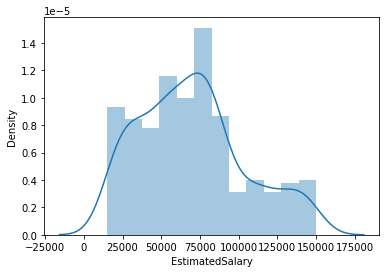

In [89]:
# Salary distribution
sns.distplot(df_net['EstimatedSalary'])

In [90]:
# Label encoding
le = LabelEncoder()
df_net['Gender']= le.fit_transform(df_net['Gender'])

<AxesSubplot:>

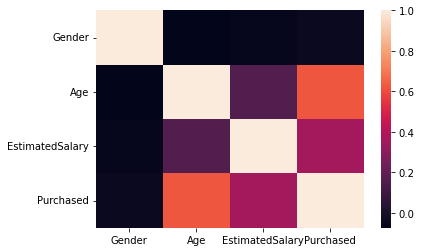

In [91]:
# Correlation matrix
df_net.corr()
sns.heatmap(df_net.corr())

In [92]:
df_net.corr()

,Gender,Age,EstimatedSalary,Purchased
Gender,1.000000,-0.073741,-0.060435,-0.042469
Age,-0.073741,1.000000,0.155238,0.622454
EstimatedSalary,-0.060435,0.155238,1.000000,0.362083
Purchased,-0.042469,0.622454,0.362083,1.000000


In [93]:
# Drop Gender column
df_net.drop(columns=['Gender'], inplace=True)

In [94]:
# Split data into dependent/independent variables
X = df_net.iloc[:, :-1].values
y = df_net.iloc[:, -1].values

In [95]:
# Split data into test/train set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = True)

In [96]:
# Scale dataset
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [97]:
# Classifier
classifier = SVC(kernel = 'linear', random_state = 0)
SVC = classifier.fit(X_train, y_train)

In [98]:
# Prediction
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred), 1), y_test.reshape(len(y_test), 1)), 1))

[[0 0]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [1 1]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 1]
 [0 0]
 [1 1]
 [1 0]
 [1 1]
 [1 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 1]
 [0 1]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 1]
 [0 1]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 0]
 [0 0]
 [0 1]
 [1 1]
 [0 0]
 [0 0]
 [1 0]
 [0 0]
 [1 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [0 0]
 [0 1]
 [0 0]
 [1 1]
 [1 1]
 [0 1]
 [0 0]
 [0 0]
 [1 1]
 [1 1]
 [0 1]
 [0 0]
 [0 0]]


In [99]:
# Accuracy
accuracy_score(y_test, y_pred)

0.82

In [100]:
# Classification report
print(f'Classification Report: \n{classification_report(y_test, y_pred)}')

Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.90      0.85        58
           1       0.83      0.71      0.77        42

    accuracy                           0.82       100
   macro avg       0.82      0.81      0.81       100
weighted avg       0.82      0.82      0.82       100



In [101]:
# F1 score
print(f"F1 Score : {f1_score(y_test, y_pred)}")

F1 Score : 0.7692307692307692


<AxesSubplot:>

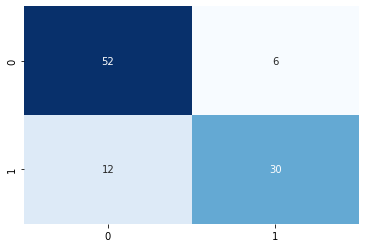

In [102]:
# Confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

In [105]:
# Predict purchase with Age(45) and Salary(97000). scaling the data. 
print(SVC.predict(sc.transform([[45, 97000]])))

[1]


Predicted value [1] means the user is going to purchase the insurance.

for example, 0 = malea nd 1 = female

Source: https://medium.com/@valentinaalto/visualizing-svm-with-python-4b4b238a7a92

   sepal_length  sepal_width  petal_length  petal_width species
0           5.1          3.5           1.4          0.2  setosa
1           4.9          3.0           1.4          0.2  setosa
2           4.7          3.2           1.3          0.2  setosa
3           4.6          3.1           1.5          0.2  setosa
4           5.0          3.6           1.4          0.2  setosa


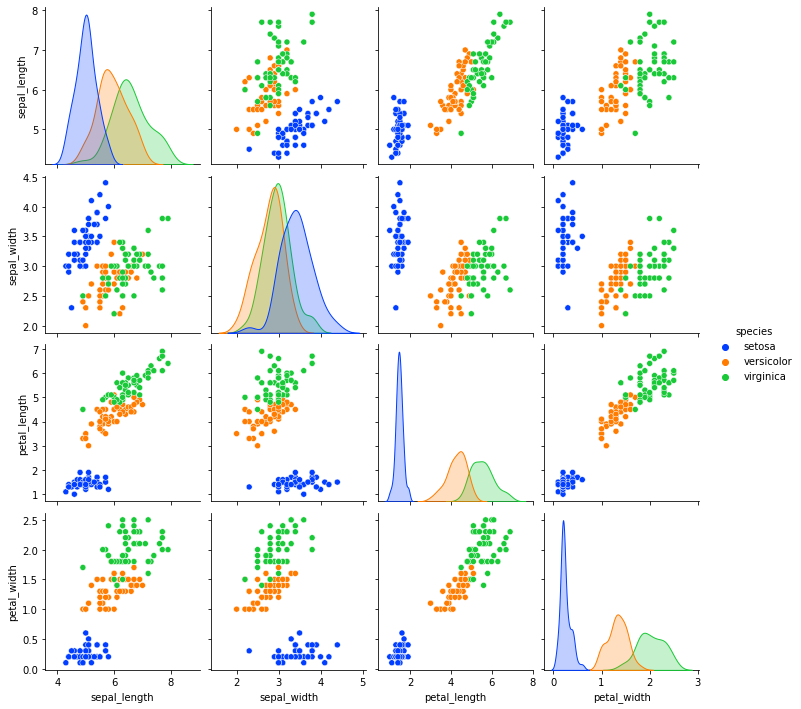

In [122]:
import seaborn as sns
iris = sns.load_dataset("iris")
print(iris.head())
y = iris.species
X = iris.drop('species',axis=1)
sns.pairplot(iris, hue="species",palette="bright")

Since I first want to deal with linearly separable and two-class data, I will focus on the graph petal_width-petal_length, for the classes Setosa and Versicolor.

In [123]:
df=iris[(iris['species']!='virginica')]
df=df.drop(['sepal_length','sepal_width'], axis=1)
df.head()

,petal_length,petal_width,species
0,1.4,0.2,setosa
1,1.4,0.2,setosa
2,1.3,0.2,setosa
3,1.5,0.2,setosa
4,1.4,0.2,setosa


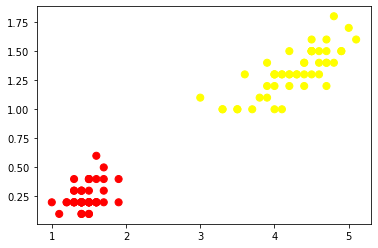

In [127]:
#let's convert categorical values to numerical target
df=df.replace('setosa', 0)
df=df.replace('versicolor', 1)
X=df.iloc[:,0:2]
y=df['species']
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=50, cmap='autumn')

In [111]:
from sklearn.svm import SVC 
model = SVC(kernel='linear', C=1E10)
model.fit(X, y)

SVC(C=10000000000.0, kernel='linear')

In [112]:
#two points. 
model.support_vectors_

array([[1.9, 0.4],
       [3. , 1.1]])

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



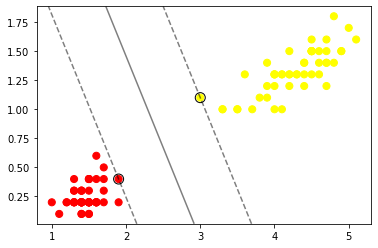

In [113]:
ax = plt.gca()
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=50, cmap='autumn')
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = model.decision_function(xy).reshape(XX.shape)

ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,
           linestyles=['--', '-', '--'])

ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='k')
plt.show()

As you can see, our algorithm found those coefficients for our hyperplane which maximize the margin.

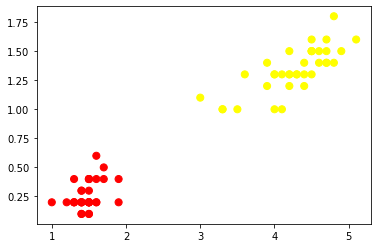

In [114]:
red_sample=df.sample(frac=0.7)
X=red_sample.iloc[:,0:2]
y=red_sample['species']
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=50, cmap='autumn')

Now, if we train again our SVM here, knowing that the two support vectors are still there, we will obtain exactly the same hyperplane:



In [115]:
model.fit(X, y)

SVC(C=10000000000.0, kernel='linear')

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



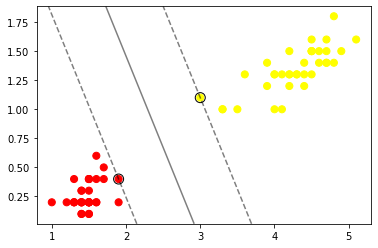

In [116]:
ax = plt.gca()
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=50, cmap='autumn')
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = model.decision_function(xy).reshape(XX.shape)

ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,
           linestyles=['--', '-', '--'])

ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='k')
plt.show()

the purpose of the edge lines show the support vectors. The entire line shows the separation of the classes. The idea is to maximize the margin in order to have the best line separation.

No-Linearly-Separable Data
For this purpose, I’m going to manually generate some no-linearly separable data. I’m doing so, rather than using the previous dataset, so that you can see the kernel function we are going to use (the Radial Basis Function) perfectly working.

In [119]:
from sklearn.datasets import make_blobs

In [133]:
data =iris[(iris['species']!='virginica')]

In [137]:
w = data['species']
w

0         setosa
1         setosa
2         setosa
3         setosa
4         setosa
         ...    
95    versicolor
96    versicolor
97    versicolor
98    versicolor
99    versicolor
Name: species, Length: 100, dtype: object

In [139]:
w.nunique()

2

In [141]:
data=data.replace('setosa', 0)
data=data.replace('versicolor', 1)

In [146]:
w = w.replace('setosa', 0)
w

0              0
1              0
2              0
3              0
4              0
         ...    
95    versicolor
96    versicolor
97    versicolor
98    versicolor
99    versicolor
Name: species, Length: 100, dtype: object

In [147]:
w = w.replace('versicolor', 1)
w

0     0
1     0
2     0
3     0
4     0
     ..
95    1
96    1
97    1
98    1
99    1
Name: species, Length: 100, dtype: int64

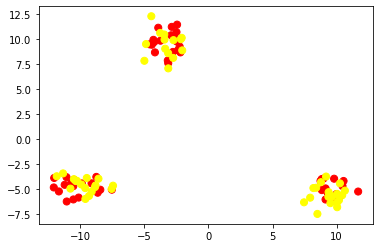

In [148]:
X, y = make_blobs(100)
plt.scatter(X[:, 0], X[:, 1], c=w, s=50, cmap='autumn')

In [149]:
model=SVC(kernel='linear').fit(X, w)

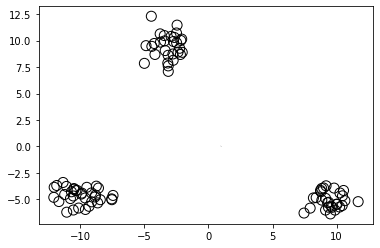

In [150]:
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()
# create grid to evaluate model
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = model.decision_function(xy).reshape(XX.shape)
# plot decision boundary and margins
ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,
           linestyles=['--', '-', '--'])
# plot support vectors
ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='k')
plt.show()

However, if we were able to move from a 2D to a 3D task, we would be able to lift all the yellow points and then use a plan to segregate the two clouds of points:

Text(0.5, 0, 'r')

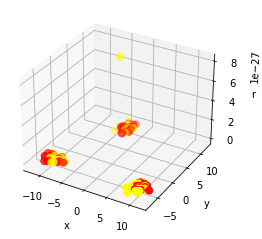

In [151]:
from mpl_toolkits import mplot3d
#setting the 3rd dimension with RBF centered on the middle clump
r = np.exp(-(X ** 2).sum(1))
ax = plt.subplot(projection='3d')
ax.scatter3D(X[:, 0], X[:, 1], r, c=w, s=50, cmap='autumn')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('r')

Luckily, we do not need to worry about these pitfalls, we don’t even have to compute the third dimension. It is implicitly done by our SVM algorithm through the kernel trick, and it is done in such a way that the two caveats above are bypassed.

# So, if we simply fit our model with kernel=rbf rather than kernel=linear:

# As you can see, without making any further computation, but simply changing one parameter of our model, we converted a no-linear problem to a linear one, thanks to the kernel trick.

In [152]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.datasets import make_circles

X, y = make_circles(n_samples=500, noise=0.06, random_state=42)

df = pd.DataFrame(dict(x1=X[:, 0], x2=X[:, 1], y=y))
df

,x1,x2,y
0,-0.750878,0.321070,1
1,-0.144829,0.990214,0
2,-0.765681,0.028995,1
3,-0.658622,-0.652663,0
4,-0.818977,0.612161,0
...,...,...,...
495,-0.877989,0.474674,0
496,0.749618,0.306804,1
497,-0.720660,0.597010,1
498,-0.136462,-0.871756,1


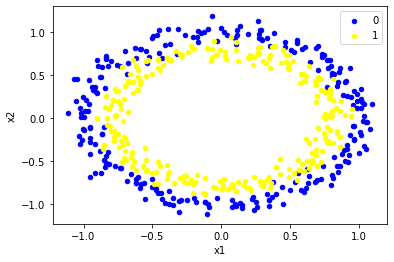

In [153]:
colors = {0:'blue', 1:'yellow'}
fig, ax = plt.subplots()
grouped = df.groupby('y')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x1', y='x2', label=key, color = colors[key])
plt.show()

In [154]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

clf = SVC(kernel="linear")

clf.fit(X, y)

pred = clf.predict(X)

print("Accuracy: ",accuracy_score(pred, y))

Accuracy:  0.496


When fitting the data into a Linear SVM model, the accuracy is around 50% which is quite low. Now let's see if we can solve this a little bit using Polynomial Kernel.

In [155]:
clf = SVC(kernel="poly")

clf.fit(X, y)

pred = clf.predict(X)

print("Accuracy: ",accuracy_score(pred, y))

Accuracy:  0.566


Well, the accuracy of the model has increased to 57% by using a polynomial kernel. However, this result is not bad but not a satisfying accuracy for a machine learning model. Now let's try to do the same using RBF kernel.

In [156]:
def RBF(X, gamma):
    
    # Free parameter gamma
    if gamma == None:
        gamma = 1.0/X.shape[1]
        
    # RBF kernel Equation
    K = np.exp(-gamma * np.sum((X - X[:,np.newaxis])**2, axis = -1))
    
    return K

This function accepts two parameters, one is the dataset for sure, and another is the gamma parameter. The gamma parameter can be any value that tunes the equation. You can try giving different values to gamma to see the change in the accuracy of prediction.

In [157]:
X = RBF(X, gamma=0.2)

In [158]:
clf = SVC(kernel="linear")

clf.fit(X, y)

pred = clf.predict(X)

print("Accuracy: ",accuracy_score(pred, y))

Accuracy:  0.94


That's great! The accuracy of the model is now 94% when using the RBF kernel for this particular dataset. This happens because the RBF kernel can transform the data points as much as possible for fitting the hyperplane between those two classes of data points. This makes the RBF kernel so powerful when comes to kernelized models.

RBF kernel can be able to solve most of the overlapped datasets (just like above). However, you don't need to think that RBF kernel can be used to solve almost any given dataset of different distributions. In some cases, the RBF kernel will not be good for some kinds of datasets, so there we can try other kernel functions.

In [2]:
#Importing the necessary packages and libaries
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import svm, datasets
import matplotlib.pyplot as plt
import numpy as np

In [3]:
iris = datasets.load_iris()
#Store variables as target y and the first two features as X (sepal length and sepal width of the iris flowers)
X = iris.data[:, :2]
y = iris.target

In [4]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [5]:
iris

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state = 0)

For the multiclass classification, the type one-versus-one is specified, as can be seen in decision_function_shape=’ovo’. For the polynomial function, the degree of 3 is selected, this is not necessary for other kernel functions.
All other parameters are set to default.

In [7]:
linear = svm.SVC(kernel='linear', C=1, decision_function_shape='ovo').fit(X_train, y_train)

In [8]:
rbf = svm.SVC(kernel='rbf', gamma=1, C=1, decision_function_shape='ovo').fit(X_train, y_train)

In [9]:
poly = svm.SVC(kernel='poly', degree=3, C=1, decision_function_shape='ovo').fit(X_train, y_train)

In [10]:
sig = svm.SVC(kernel='sigmoid', C=1, decision_function_shape='ovo').fit(X_train, y_train)

In [11]:
#stepsize in the mesh, it alters the accuracy of the plotprint
#to better understand it, just play with the value, change it and print it
h = .01
#create the mesh
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h))
# create the title that will be shown on the plot
titles = ['Linear kernel','RBF kernel','Polynomial kernel','Sigmoid kernel']

plot all the kernel functions: 

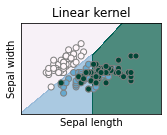

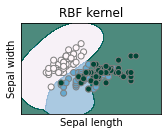

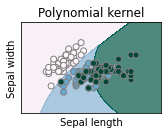

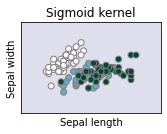

In [12]:
for i, clf in enumerate((linear, rbf, poly, sig)):
    #defines how many plots: 2 rows, 2columns=> leading to 4 plots
    plt.subplot(2, 2, i + 1) #i+1 is the index
    #space between plots
    plt.subplots_adjust(wspace=0.4, hspace=0.4) 
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=plt.cm.PuBuGn, alpha=0.7)
    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.PuBuGn,     edgecolors='grey')
    plt.xlabel('Sepal length')
    plt.ylabel('Sepal width')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xticks(())
    plt.yticks(())
    plt.title(titles[i])
    plt.show()

In [13]:
linear_pred = linear.predict(X_test)
poly_pred = poly.predict(X_test)
rbf_pred = rbf.predict(X_test)
sig_pred = sig.predict(X_test)

In [16]:
# retrieve the accuracy and print it for all 4 kernel functions
accuracy_lin = linear.score(X_test, y_test)
accuracy_poly = poly.score(X_test, y_test)
accuracy_rbf = rbf.score(X_test, y_test)
accuracy_sig = sig.score(X_test, y_test)
print('Accuracy Linear Kernel:', accuracy_lin)
print('Accuracy Polynomial Kernel:', accuracy_poly)
print('Accuracy Radial Basis Kernel:', accuracy_rbf)
print('Accuracy Sigmoid Kernel:', accuracy_sig)

Accuracy Linear Kernel: 0.7333333333333333
Accuracy Polynomial Kernel: 0.7333333333333333
Accuracy Radial Basis Kernel: 0.6666666666666666
Accuracy Sigmoid Kernel: 0.2


In [19]:
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(rbf , param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.875 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.750 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.875 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.833 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.750 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.667 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.667 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.708 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.708 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.667 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.375 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.917 total time=   0.0s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.750 total time=   0.0s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.792 total time=   0.0s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.792 total time=   0.0s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.750 total time=   0.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.875 total time=   0.0s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.708 total time=   0.0s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.833 total time=   0.0s
[CV 4/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.792 total time=   0.0s
[CV 5/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.750 total time=   0.0s
[CV 1/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.875 total time=   0.0s
[CV 2/5] END ...C=1000, gamma=0.001, kernel=rbf;, score=0.750 total time=   0.0s
[CV 3/5] END ...C=1000, gamm

GridSearchCV(estimator=SVC(C=1, decision_function_shape='ovo', gamma=1),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [20]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
SVC(C=1, decision_function_shape='ovo', gamma=0.1)


In [21]:
rbf_2 = svm.SVC(kernel='rbf', gamma=0.1, C=1, decision_function_shape='ovo').fit(X_train, y_train)

In [22]:
accuracy_rbf = rbf_2.score(X_test, y_test)
accuracy_rbf

0.7333333333333333

the rbf with this optimization has improved the scroe from 0.66 to 0.7333

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.svm import SVC
from sklearn.datasets import make_classification

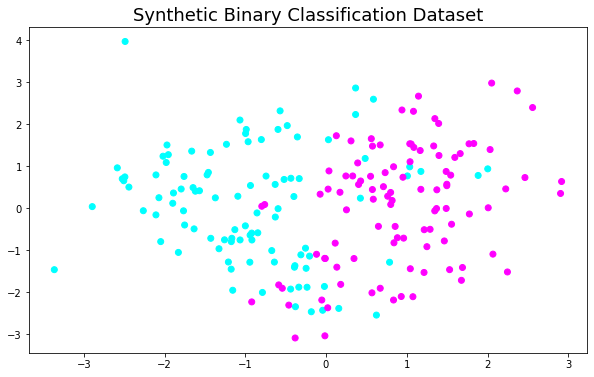

In [2]:
X, y = make_classification(n_samples=200, n_features=2,
n_informative=2, n_redundant=0, n_repeated=0, n_classes=2,random_state=42)
plt.figure(figsize=(10,6))
plt.title("Synthetic Binary Classification Dataset", fontsize=18)
plt.scatter(X[:,0], X[:,1], c=y, cmap='cool')

In [4]:
def plot_svc_decision_function(model, ax=None, plot_support=True):
    """Plot the decision function for a 2D SVC"""
    if ax is None:
        ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # create grid to evaluate model
    x = np.linspace(xlim[0], xlim[1], 30)
    y = np.linspace(ylim[0], ylim[1], 30)
    Y, X = np.meshgrid(y, x)
    xy = np.vstack([X.ravel(), Y.ravel()]).T
    P = model.decision_function(xy).reshape(X.shape)
    
    # plot decision boundary and margins
    ax.contour(X, Y, P, colors='k',
               levels=[-1, 0, 1], alpha=0.5,
               linestyles=['--', '-', '--'])
    
    # plot support vectors
    if plot_support:
        ax.scatter(model.support_vectors_[:, 0],
                   model.support_vectors_[:, 1],
                   s=300, linewidth=1, facecolors='none');
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

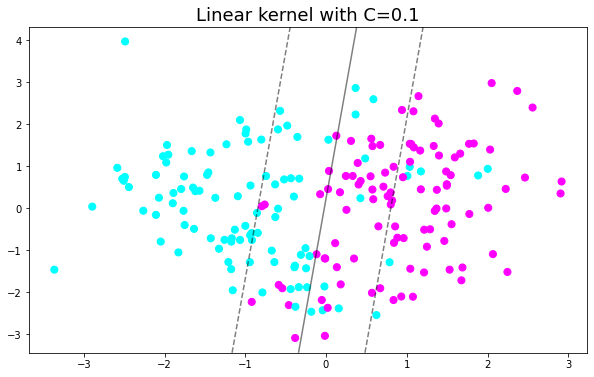

In [5]:
clf = SVC(C=0.1, kernel='linear').fit(X, y)
plt.figure(figsize=(10,6))
plt.title("Linear kernel with C=0.1", fontsize=18)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='cool')
plot_svc_decision_function(clf)

Just change the C value as 100 to produce the following plot.

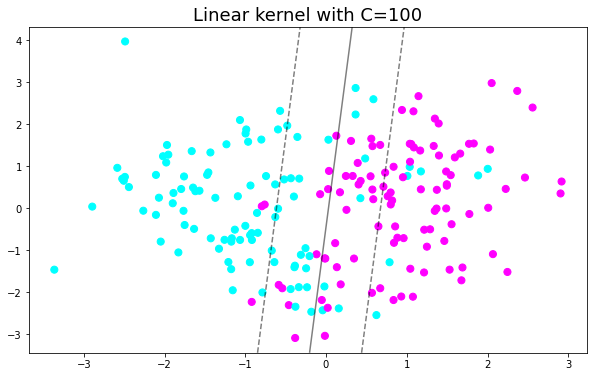

In [7]:
clf = SVC(C=100, kernel='linear').fit(X, y)
plt.figure(figsize=(10,6))
plt.title("Linear kernel with C=100", fontsize=18)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='cool')
plot_svc_decision_function(clf)

When we increase the C value, the margin gets smaller. Thus, the models with low C values tend to be more generalized. The difference becomes more clear with larger datasets.

Gamma is a hyperparameter used with non-linear SVM. One of the most commonly used non-linear kernels is the radial basis function (RBF). Gamma parameter of RBF controls the distance of the influence of a single training point.

Low values of gamma indicate a large similarity radius which results in more points being grouped together. For high values of gamma, the points need to be very close to each other in order to be considered in the same group (or class).

# Therefore, models with very large gamma values tend to overfit.

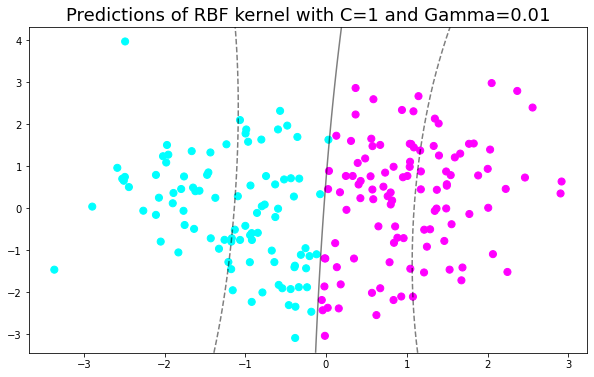

In [8]:
clf = SVC(C=1, kernel='rbf', gamma=0.01).fit(X, y)
y_pred = clf.predict(X)
plt.figure(figsize=(10,6))
plt.title("Predictions of RBF kernel with C=1 and Gamma=0.01", fontsize=18)
plt.scatter(X[:, 0], X[:, 1], c=y_pred, s=50, cmap='cool')
plot_svc_decision_function(clf)

Just change the gamma values to produce the following plots.

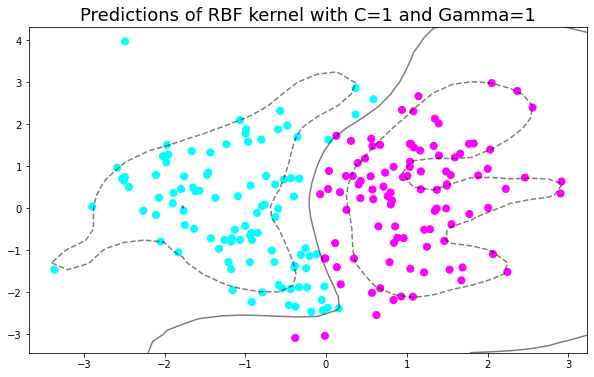

In [9]:
clf = SVC(C=1, kernel='rbf', gamma=1).fit(X, y)
y_pred = clf.predict(X)
plt.figure(figsize=(10,6))
plt.title("Predictions of RBF kernel with C=1 and Gamma=1", fontsize=18)
plt.scatter(X[:, 0], X[:, 1], c=y_pred, s=50, cmap='cool')
plot_svc_decision_function(clf)

As the gamma values increase, the model is becoming overfit. The data points need to be very close in order to be grouped together because the similarity radius decreases with an increasing gamma value.

The accuracies of RBF kernels on this dataset with gamma values 0.01, 1, and 5 are 0.89, 0.92, and 0.93, respectively. These values indicate that models are overfitting to the training set as the gamma values increase.

# Gamma vs C parameter. For a linear kernel, we just need to optimize the c parameter. However, if we want to use an RBF kernel, both c and gamma parameters need to optimized simultaneously. If gamma is large, the effect of c becomes negligible. If gamma is small, c affects the model just like how it affects a linear model. Typical values for c and gamma are as follows. However, specific optimal values may exist depending on the application:0.0001 < gamma < 10 and 0.1 < c < 100. 

In [11]:
from sklearn.datasets import make_blobs

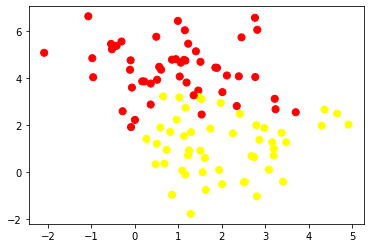

In [14]:
X, y = make_blobs(n_samples=100, centers=2,
                  random_state=0, cluster_std=1.2)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn');

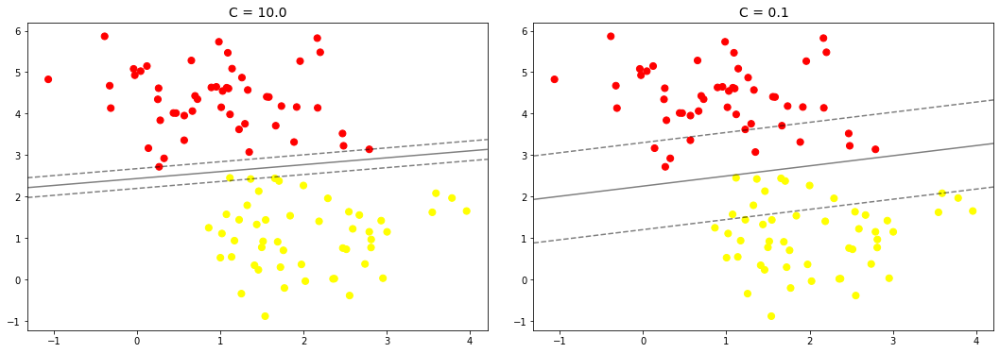

In [15]:
X, y = make_blobs(n_samples=100, centers=2,
                  random_state=0, cluster_std=0.8)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
fig.subplots_adjust(left=0.0625, right=0.95, wspace=0.1)

for axi, C in zip(ax, [10.0, 0.1]):
    model = SVC(kernel='linear', C=C).fit(X, y)
    axi.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
    plot_svc_decision_function(model, axi)
    axi.scatter(model.support_vectors_[:, 0],
                model.support_vectors_[:, 1],
                s=300, lw=1, facecolors='none');
    axi.set_title('C = {0:.1f}'.format(C), size=14)

with C 10 the margin narrows and the model is overfitted. 

Face Recognition: 

In [16]:
from sklearn.datasets import fetch_lfw_people
faces = fetch_lfw_people(min_faces_per_person=60)
print(faces.target_names)
print(faces.images.shape)

['Ariel Sharon' 'Colin Powell' 'Donald Rumsfeld' 'George W Bush'
 'Gerhard Schroeder' 'Hugo Chavez' 'Junichiro Koizumi' 'Tony Blair']
(1348, 62, 47)


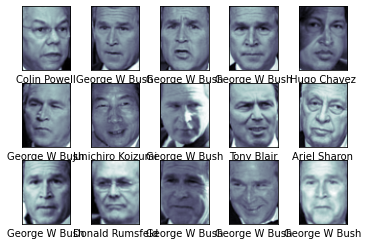

In [17]:
fig, ax = plt.subplots(3, 5)
for i, axi in enumerate(ax.flat):
    axi.imshow(faces.images[i], cmap='bone')
    axi.set(xticks=[], yticks=[],
            xlabel=faces.target_names[faces.target[i]])

Each image contains [62×47] or nearly 3,000 pixels. We could proceed by simply using each pixel value as a feature, but often it is more effective to use some sort of preprocessor to extract more meaningful features; here we will use a principal component analysis (see In Depth: Principal Component Analysis) to extract 150 fundamental components to feed into our support vector machine classifier. We can do this most straightforwardly by packaging the preprocessor and the classifier into a single pipeline:

In [19]:
from sklearn.svm import SVC
from sklearn.decomposition import PCA as RandomizedPCA
#from sklearn.decomposition import RandomizedPCA
from sklearn.pipeline import make_pipeline

pca = RandomizedPCA(n_components=150, whiten=True, random_state=42)
svc = SVC(kernel='rbf', class_weight='balanced')
model = make_pipeline(pca, svc)

In [21]:
faces.data

array([[0.53333336, 0.52418303, 0.49673203, ..., 0.00653595, 0.00653595,
        0.00130719],
       [0.28627452, 0.20784314, 0.2535948 , ..., 0.96993464, 0.95032686,
        0.9346406 ],
       [0.31633988, 0.3895425 , 0.275817  , ..., 0.4261438 , 0.7895425 ,
        0.9555555 ],
       ...,
       [0.11633987, 0.11111111, 0.10196079, ..., 0.5660131 , 0.579085  ,
        0.5542484 ],
       [0.19346406, 0.21045752, 0.29150328, ..., 0.6875817 , 0.6575164 ,
        0.5908497 ],
       [0.12418301, 0.09673203, 0.10849673, ..., 0.12941177, 0.16209151,
        0.29150328]], dtype=float32)

In [22]:
faces.target

array([1, 3, 3, ..., 7, 3, 5], dtype=int64)

In [24]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(faces.data, faces.target,
                                                random_state=42)

In [ ]:
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(rbf , param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train, y_train)

In [26]:
from sklearn.model_selection import GridSearchCV
param_grid = {'svc__C': [1, 5, 10, 50],
              'svc__gamma': [0.0001, 0.0005, 0.001, 0.005]}
grid = GridSearchCV(model, param_grid)

%time grid.fit(Xtrain, ytrain)
print(grid.best_params_)

Wall time: 28.4 s
{'svc__C': 5, 'svc__gamma': 0.001}


Now with this cross-validated model, we can predict the labels for the test data, which the model has not yet seen:

In [27]:
model = grid.best_estimator_
yfit = model.predict(Xtest)

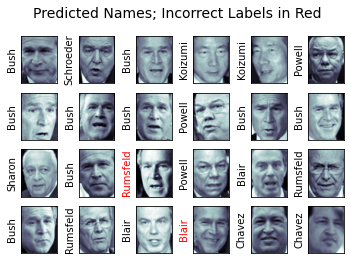

In [28]:
#two mislabeled faces. 
fig, ax = plt.subplots(4, 6)
for i, axi in enumerate(ax.flat):
    axi.imshow(Xtest[i].reshape(62, 47), cmap='bone')
    axi.set(xticks=[], yticks=[])
    axi.set_ylabel(faces.target_names[yfit[i]].split()[-1],
                   color='black' if yfit[i] == ytest[i] else 'red')
fig.suptitle('Predicted Names; Incorrect Labels in Red', size=14);

In [29]:
from sklearn.metrics import classification_report
print(classification_report(ytest, yfit,
                            target_names=faces.target_names))

                   precision    recall  f1-score   support

     Ariel Sharon       0.65      0.87      0.74        15
     Colin Powell       0.83      0.88      0.86        68
  Donald Rumsfeld       0.70      0.84      0.76        31
    George W Bush       0.97      0.80      0.88       126
Gerhard Schroeder       0.76      0.83      0.79        23
      Hugo Chavez       0.93      0.70      0.80        20
Junichiro Koizumi       0.86      1.00      0.92        12
       Tony Blair       0.82      0.98      0.89        42

         accuracy                           0.85       337
        macro avg       0.82      0.86      0.83       337
     weighted avg       0.86      0.85      0.85       337



In [31]:
import seaborn as sns

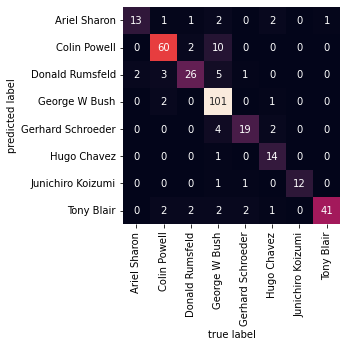

In [32]:
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(ytest, yfit)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=faces.target_names,
            yticklabels=faces.target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

for example in the first x label, 13 Ariel Sharon images were predicted properly and 2 were wrongly predicted as Donald Rumsfeid. 

George Bush has been the one with more wrongly predicted values. 

Their dependence on relatively few support vectors means that they are very compact models, and take up very little memory.
Once the model is trained, the prediction phase is very fast.
Because they are affected only by points near the margin, they work well with high-dimensional data—even data with more dimensions than samples, which is a challenging regime for other algorithms.
Their integration with kernel methods makes them very versatile, able to adapt to many types of data.

The results are strongly dependent on a suitable choice for the softening parameter C
. This must be carefully chosen via cross-validation, which can be expensive as datasets grow in size.

See a cross validation example in machine learning. 

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from mlxtend.plotting import plot_decision_regions

In [36]:
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/weather.csv')
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,8.0,24.3,0.0,3.4,6.3,NW,30.0,SW,NW,6.0,...,29,1019.7,1015.0,7,7,14.4,23.6,No,3.6,Yes
1,14.0,26.9,3.6,4.4,9.7,ENE,39.0,E,W,4.0,...,36,1012.4,1008.4,5,3,17.5,25.7,Yes,3.6,Yes
2,13.7,23.4,3.6,5.8,3.3,NW,85.0,N,NNE,6.0,...,69,1009.5,1007.2,8,7,15.4,20.2,Yes,39.8,Yes
3,13.3,15.5,39.8,7.2,9.1,NW,54.0,WNW,W,30.0,...,56,1005.5,1007.0,2,7,13.5,14.1,Yes,2.8,Yes
4,7.6,16.1,2.8,5.6,10.6,SSE,50.0,SSE,ESE,20.0,...,49,1018.3,1018.5,7,7,11.1,15.4,Yes,0.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,9.0,30.7,0.0,7.6,12.1,NNW,76.0,SSE,NW,7.0,...,15,1016.1,1010.8,1,3,20.4,30.0,No,0.0,No
362,7.1,28.4,0.0,11.6,12.7,N,48.0,NNW,NNW,2.0,...,22,1020.0,1016.9,0,1,17.2,28.2,No,0.0,No
363,12.5,19.9,0.0,8.4,5.3,ESE,43.0,ENE,ENE,11.0,...,47,1024.0,1022.8,3,2,14.5,18.3,No,0.0,No
364,12.5,26.9,0.0,5.0,7.1,NW,46.0,SSW,WNW,6.0,...,39,1021.0,1016.2,6,7,15.8,25.9,No,0.0,No


In [40]:
df.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow'],
      dtype='object')

In [41]:
#loc is always a label based filter. 
df1 = df.loc[:, ["MaxTemp","Humidity3pm","WindSpeed3pm","WindGustSpeed","Evaporation","Sunshine","Pressure3pm","RainTomorrow"]] 

In [42]:
df1

,MaxTemp,Humidity3pm,WindSpeed3pm,WindGustSpeed,Evaporation,Sunshine,Pressure3pm,RainTomorrow
0,24.3,29,20,30.0,3.4,6.3,1015.0,Yes
1,26.9,36,17,39.0,4.4,9.7,1008.4,Yes
2,23.4,69,6,85.0,5.8,3.3,1007.2,Yes
3,15.5,56,24,54.0,7.2,9.1,1007.0,Yes
4,16.1,49,28,50.0,5.6,10.6,1018.5,No
...,...,...,...,...,...,...,...,...
361,30.7,15,50,76.0,7.6,12.1,1010.8,No
362,28.4,22,19,48.0,11.6,12.7,1016.9,No
363,19.9,47,9,43.0,8.4,5.3,1022.8,No
364,26.9,39,28,46.0,5.0,7.1,1016.2,No


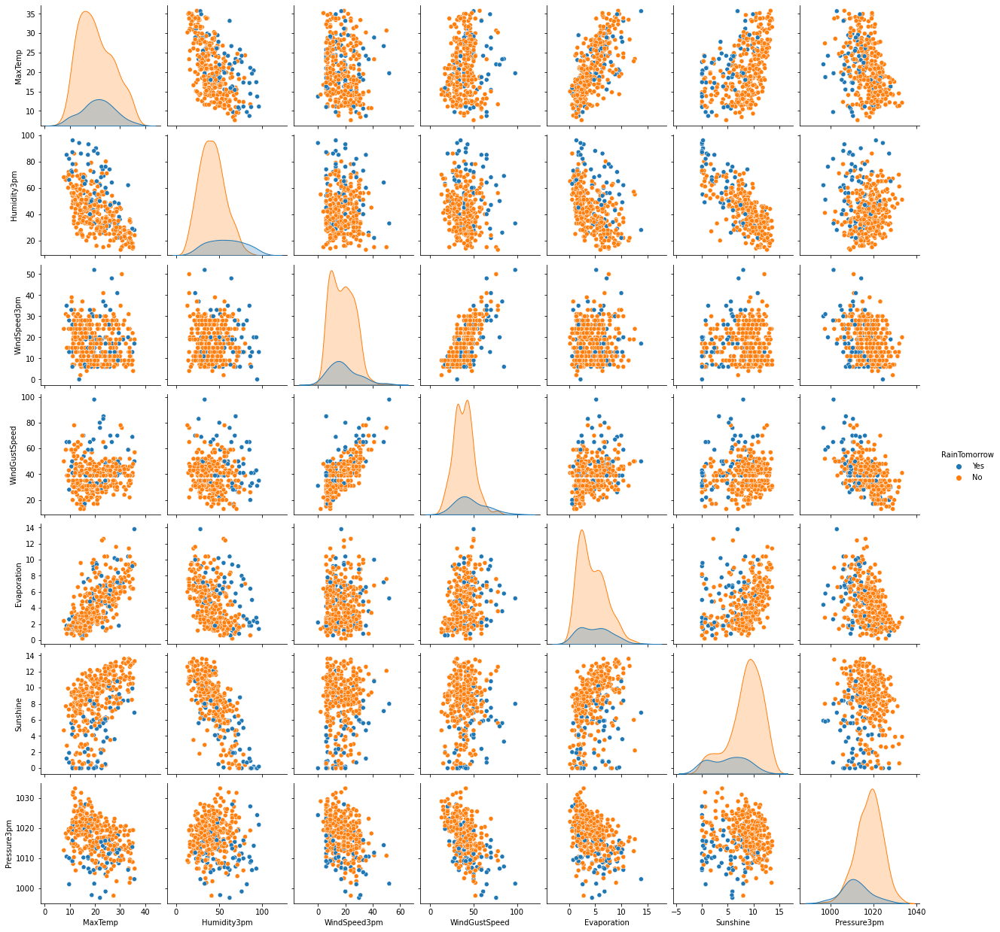

In [43]:
#Exploring dataset distribution:
sns.pairplot(df1, kind="scatter", hue="RainTomorrow")
plt.show()

<AxesSubplot:>

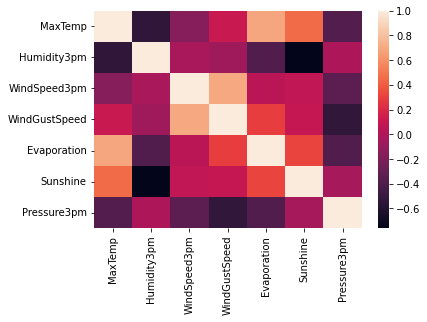

In [44]:
sns.heatmap(df1.corr())

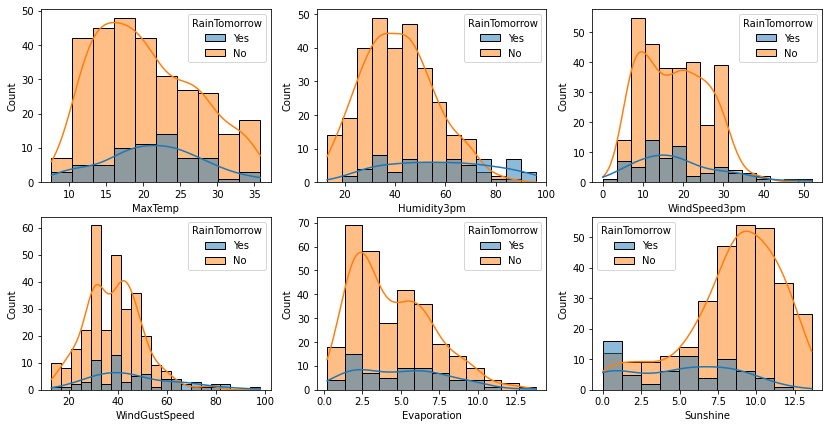

In [45]:
fig, axs = plt.subplots(2, 3, figsize=(14, 7))
sns.histplot(data=df, x="MaxTemp", hue="RainTomorrow", kde=True, color="skyblue", ax=axs[0, 0])
sns.histplot(data=df, x="Humidity3pm", hue="RainTomorrow", kde=True, color="skyblue", ax=axs[0, 1])
sns.histplot(data=df, x="WindSpeed3pm", hue="RainTomorrow", kde=True, color="skyblue", ax=axs[0, 2])
sns.histplot(data=df, x="WindGustSpeed", hue="RainTomorrow", kde=True, color="skyblue", ax=axs[1, 0])
sns.histplot(data=df, x="Evaporation", hue="RainTomorrow", kde=True, color="skyblue", ax=axs[1, 1])
sns.histplot(data=df, x="Sunshine", hue="RainTomorrow", kde=True, color="skyblue", ax=axs[1, 2])
plt.show()

SVC does not accept missing values encoded as NaN natively.

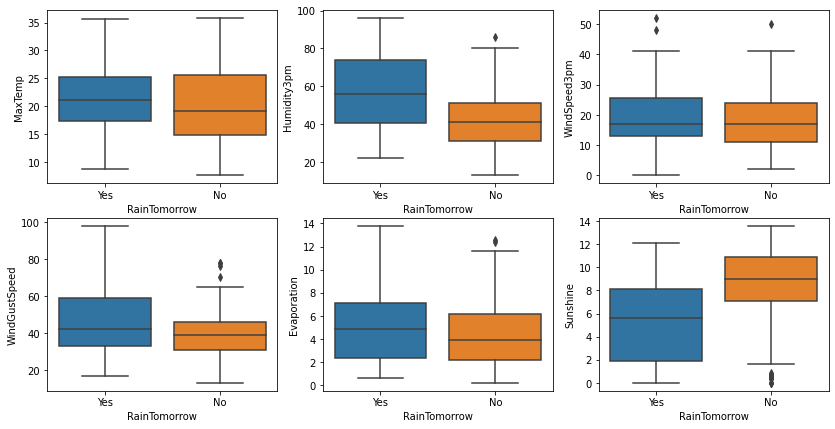

In [46]:
fig, axs = plt.subplots(2, 3, figsize=(14, 7))
sns.boxplot(x=df["RainTomorrow"], y=df["MaxTemp"], ax=axs[0, 0])
sns.boxplot(x=df["RainTomorrow"], y=df["Humidity3pm"], ax=axs[0, 1])
sns.boxplot(x=df["RainTomorrow"], y=df["WindSpeed3pm"], ax=axs[0, 2])
sns.boxplot(x=df["RainTomorrow"], y=df["WindGustSpeed"],ax=axs[1, 0])
sns.boxplot(x=df["RainTomorrow"], y=df["Evaporation"], ax=axs[1, 1] )
sns.boxplot(x=df["RainTomorrow"], y=df["Sunshine"], ax=axs[1, 2])
plt.show()

Humidity and sunshine separates the classes pretty clear. 

In [50]:
df1.isnull().sum()

MaxTemp          0
Humidity3pm      0
WindSpeed3pm     0
WindGustSpeed    2
Evaporation      0
Sunshine         3
Pressure3pm      0
RainTomorrow     0
dtype: int64

In [52]:
df1['WindGustSpeed'] = df1['WindGustSpeed'].fillna(df1['WindGustSpeed'].mean())

In [53]:
df1['Sunshine'] = df1['Sunshine'].fillna(df1['Sunshine'].mean())

In [54]:
X = df1.drop('RainTomorrow', axis=1)
y = df1['RainTomorrow']

And split our data, with 80% of observations for model building and 20% for testing.

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [56]:
LinearSVM = LinearSVC().fit(X_train, y_train)
print("training set score: %f" % LinearSVM.score(X_train, y_train))
print("test set score: %f" % LinearSVM.score(X_test, y_test))

training set score: 0.866438
test set score: 0.905405


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


As train and test accuracy are very close, this means that our model is not overfitting.

0.1 < c < 100

The C parameter:
The C value in Logistic Regression is an user adjustable parameter that controls regularisation. In simple terms, higher values of C will instruct our model to fit the training set as best as possible, while lower C values will favour a simple models with coefficients closer to zero, underfitting. 

by default this value is 1

In [57]:
#C=100
LinearSVM100 = LinearSVC(C=100).fit(X_train, y_train)
print("training set score: %f" % LinearSVM100.score(X_train, y_train))
print("test set score: %f" % LinearSVM100.score(X_test, y_test))

training set score: 0.825342
test set score: 0.905405


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [60]:
#C=20
LinearSVM20 = LinearSVC(C=20).fit(X_train, y_train)
print("training set score: %f" % LinearSVM100.score(X_train, y_train))
print("test set score: %f" % LinearSVM100.score(X_test, y_test))

training set score: 0.856164
test set score: 0.932432


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [61]:
#C=0.1
LinearSVM = LinearSVC(C=0.1).fit(X_train, y_train)
print("training set score: %f" % LinearSVM100.score(X_train, y_train))
print("test set score: %f" % LinearSVM100.score(X_test, y_test))

training set score: 0.856164
test set score: 0.932432


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


As you can see, changing C to 0.01 improved, even more, our SVM model.But it gives the same scores as C=20.Lower values of C in this model give better results. 

In [66]:
df1

,MaxTemp,Humidity3pm,WindSpeed3pm,WindGustSpeed,Evaporation,Sunshine,Pressure3pm,RainTomorrow
0,24.3,29,20,30.0,3.4,6.3,1015.0,Yes
1,26.9,36,17,39.0,4.4,9.7,1008.4,Yes
2,23.4,69,6,85.0,5.8,3.3,1007.2,Yes
3,15.5,56,24,54.0,7.2,9.1,1007.0,Yes
4,16.1,49,28,50.0,5.6,10.6,1018.5,No
...,...,...,...,...,...,...,...,...
361,30.7,15,50,76.0,7.6,12.1,1010.8,No
362,28.4,22,19,48.0,11.6,12.7,1016.9,No
363,19.9,47,9,43.0,8.4,5.3,1022.8,No
364,26.9,39,28,46.0,5.0,7.1,1016.2,No


In [67]:
df1['RainTomorrow'] = df1['RainTomorrow'].map({'Yes': 1, 'No': 0})

In [80]:
def LinearSVM_comparison(data,c):
    x = df1[['Humidity3pm','Sunshine']].values
    y = df1['RainTomorrow'].astype(int).values
    LinearSVM_plot = LinearSVC(C=c)
    LinearSVM_plot.fit(x,y)
    print(LinearSVM_plot.score(x,y))
    #Plot decision region:
    plot_decision_regions(x,y, clf=LinearSVM_plot, legend=2)
    #Adding axes annotations:
    plt.xlabel('X_train')
    plt.ylabel('y_train')
    plt.legend(loc='upper right')
    plt.title('Linear SVM with C='+str(c))
    plt.show()

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


0.8306010928961749


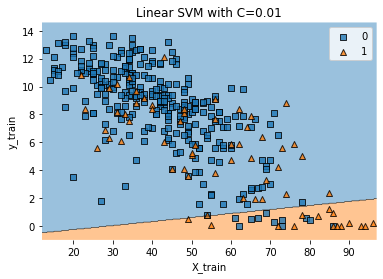

In [81]:
LinearSVM_comparison(df1,0.01)

# Multi-class classification with SVM

In [171]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,HumidityCategories
0,8.0,24.3,0.0,3.4,6.3,NW,30.0,SW,NW,6.0,...,1019.7,1015.0,7,7,14.4,23.6,No,3.6,Yes,low
1,14.0,26.9,3.6,4.4,9.7,ENE,39.0,E,W,4.0,...,1012.4,1008.4,5,3,17.5,25.7,Yes,3.6,Yes,low
2,13.7,23.4,3.6,5.8,3.3,NW,85.0,N,NNE,6.0,...,1009.5,1007.2,8,7,15.4,20.2,Yes,39.8,Yes,high
3,13.3,15.5,39.8,7.2,9.1,NW,54.0,WNW,W,30.0,...,1005.5,1007.0,2,7,13.5,14.1,Yes,2.8,Yes,middle
4,7.6,16.1,2.8,5.6,10.6,SSE,50.0,SSE,ESE,20.0,...,1018.3,1018.5,7,7,11.1,15.4,Yes,0.0,No,middle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,9.0,30.7,0.0,7.6,12.1,NNW,76.0,SSE,NW,7.0,...,1016.1,1010.8,1,3,20.4,30.0,No,0.0,No,low
362,7.1,28.4,0.0,11.6,12.7,N,48.0,NNW,NNW,2.0,...,1020.0,1016.9,0,1,17.2,28.2,No,0.0,No,low
363,12.5,19.9,0.0,8.4,5.3,ESE,43.0,ENE,ENE,11.0,...,1024.0,1022.8,3,2,14.5,18.3,No,0.0,No,middle
364,12.5,26.9,0.0,5.0,7.1,NW,46.0,SSW,WNW,6.0,...,1021.0,1016.2,6,7,15.8,25.9,No,0.0,No,low


In [130]:
df['WindGustDir'].value_counts()

NW     73
NNW    44
E      37
WNW    35
ENE    30
ESE    23
S      22
N      21
W      20
NE     16
SSE    12
SE     12
NNE     8
SSW     5
SW      3
WSW     2
Name: WindGustDir, dtype: int64

In [85]:
df['Pressure3pm'].min()

996.8

In [88]:
df['Humidity3pm'].max()

96

In [89]:
df['Humidity3pm'].min()

13

In [172]:
bins = [13,40,67,96]
labels = ['low','middle','high']
df['HumidityCategories'] = pd.cut(df['Humidity3pm'], bins=bins, labels=labels)
print(df)

     MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine WindGustDir  \
0        8.0     24.3       0.0          3.4       6.3          NW   
1       14.0     26.9       3.6          4.4       9.7         ENE   
2       13.7     23.4       3.6          5.8       3.3          NW   
3       13.3     15.5      39.8          7.2       9.1          NW   
4        7.6     16.1       2.8          5.6      10.6         SSE   
..       ...      ...       ...          ...       ...         ...   
361      9.0     30.7       0.0          7.6      12.1         NNW   
362      7.1     28.4       0.0         11.6      12.7           N   
363     12.5     19.9       0.0          8.4       5.3         ESE   
364     12.5     26.9       0.0          5.0       7.1          NW   
365     12.3     30.2       0.0          6.0      12.6          NW   

     WindGustSpeed WindDir9am WindDir3pm  WindSpeed9am  ...  Pressure9am  \
0             30.0         SW         NW           6.0  ...       1019.7   
1      

In [173]:
#loc is always a label based filter. 
df2 = df.loc[:, ["MaxTemp","Humidity3pm","WindSpeed3pm","WindGustSpeed","Evaporation","Sunshine","Pressure3pm","Cloud3pm","Temp3pm","HumidityCategories"]]
df2

,MaxTemp,Humidity3pm,WindSpeed3pm,WindGustSpeed,Evaporation,Sunshine,Pressure3pm,Cloud3pm,Temp3pm,HumidityCategories
0,24.3,29,20,30.0,3.4,6.3,1015.0,7,23.6,low
1,26.9,36,17,39.0,4.4,9.7,1008.4,3,25.7,low
2,23.4,69,6,85.0,5.8,3.3,1007.2,7,20.2,high
3,15.5,56,24,54.0,7.2,9.1,1007.0,7,14.1,middle
4,16.1,49,28,50.0,5.6,10.6,1018.5,7,15.4,middle
...,...,...,...,...,...,...,...,...,...,...
361,30.7,15,50,76.0,7.6,12.1,1010.8,3,30.0,low
362,28.4,22,19,48.0,11.6,12.7,1016.9,1,28.2,low
363,19.9,47,9,43.0,8.4,5.3,1022.8,2,18.3,middle
364,26.9,39,28,46.0,5.0,7.1,1016.2,7,25.9,low


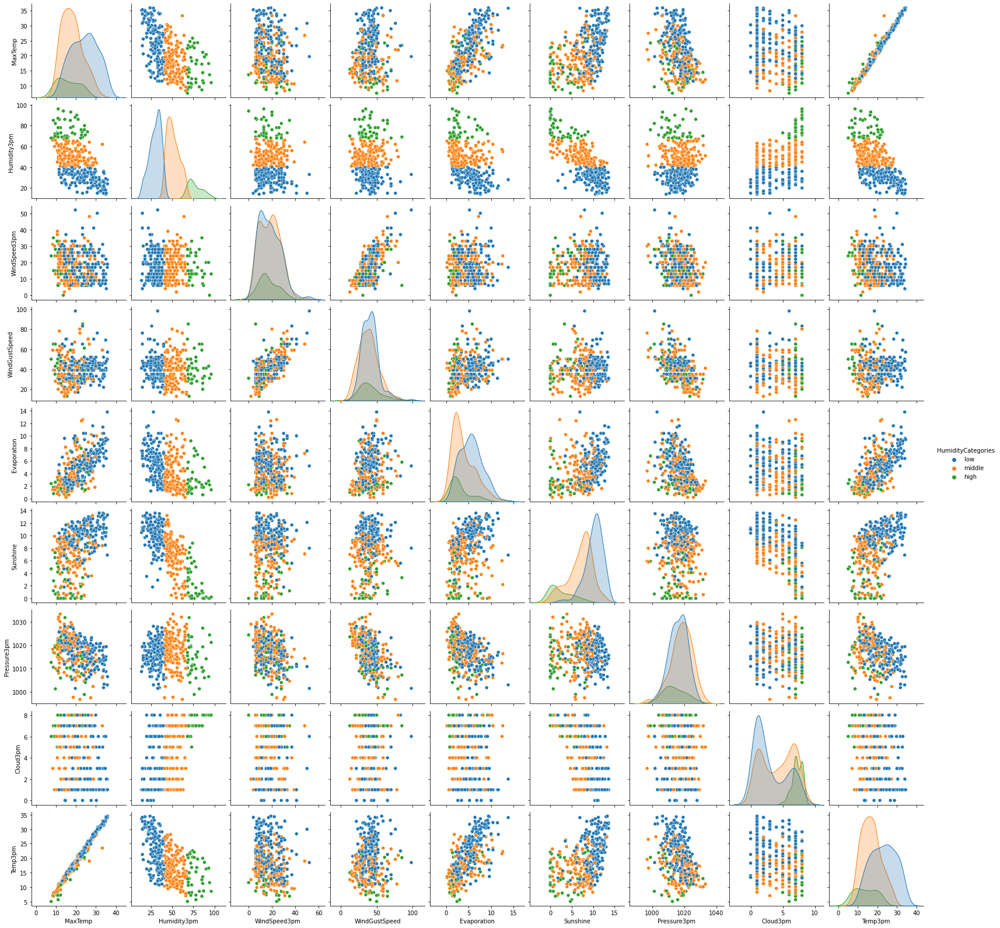

In [92]:
#Exploring dataset:
sns.pairplot(df2, kind="scatter", hue="HumidityCategories")
plt.show()

We can check how data is distributed in the three categories:

In [93]:
df2.columns

Index(['MaxTemp', 'Humidity3pm', 'WindSpeed3pm', 'WindGustSpeed',
       'Evaporation', 'Sunshine', 'Pressure3pm', 'Cloud3pm', 'Temp3pm',
       'HumidityCategories'],
      dtype='object')

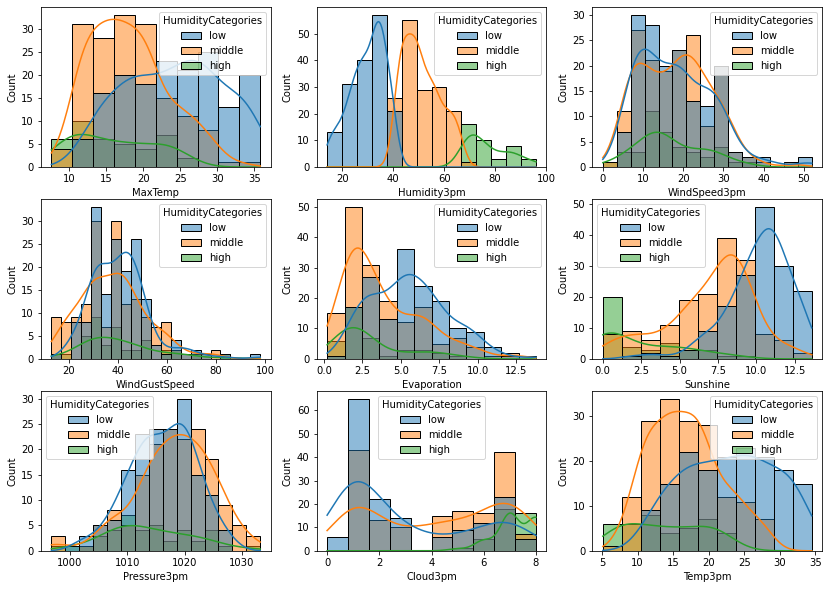

In [99]:
fig, axs = plt.subplots(3, 3, figsize=(14, 10))
sns.histplot(data=df2, x="MaxTemp", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[0, 0])
sns.histplot(data=df2, x="Humidity3pm", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[0, 1])
sns.histplot(data=df2, x="WindSpeed3pm", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[0, 2])
sns.histplot(data=df2, x="WindGustSpeed", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[1, 0])
sns.histplot(data=df2, x="Evaporation", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[1, 1])
sns.histplot(data=df2, x="Sunshine", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[1, 2])
sns.histplot(data=df2, x="Pressure3pm", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[2, 0])
sns.histplot(data=df2, x="Cloud3pm", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[2, 1])
sns.histplot(data=df2, x="Temp3pm", hue="HumidityCategories", kde=True, color="skyblue", ax=axs[2, 2])
plt.show()

And how the variables perform at distinguishing between the three categories:

In [100]:
df2.columns

Index(['MaxTemp', 'Humidity3pm', 'WindSpeed3pm', 'WindGustSpeed',
       'Evaporation', 'Sunshine', 'Pressure3pm', 'Cloud3pm', 'Temp3pm',
       'HumidityCategories'],
      dtype='object')

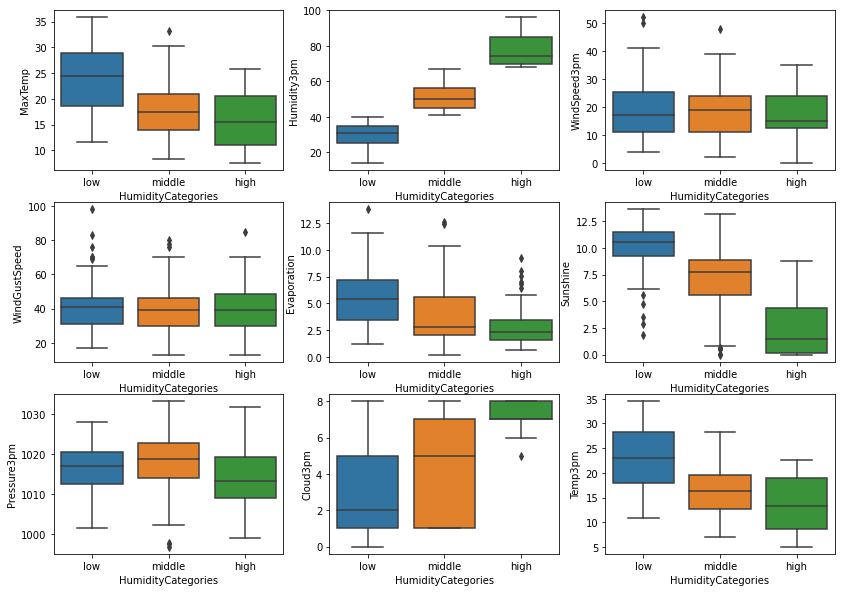

In [102]:
fig, axs = plt.subplots(3, 3, figsize=(14, 10))
sns.boxplot(x=df2["HumidityCategories"], y=df2["MaxTemp"], ax=axs[0, 0])
sns.boxplot(x=df2["HumidityCategories"], y=df2["Humidity3pm"], ax=axs[0, 1])
sns.boxplot(x=df["HumidityCategories"], y=df2["WindSpeed3pm"], ax=axs[0, 2])
sns.boxplot(x=df2["HumidityCategories"], y=df2["WindGustSpeed"], ax=axs[1, 0])
sns.boxplot(x=df2["HumidityCategories"], y=df2["Evaporation"], ax=axs[1, 1])
sns.boxplot(x=df2["HumidityCategories"], y=df2["Sunshine"], ax=axs[1, 2])
sns.boxplot(x=df2["HumidityCategories"], y=df2["Pressure3pm"], ax=axs[2, 0])
sns.boxplot(x=df2["HumidityCategories"], y=df2["Cloud3pm"], ax=axs[2, 1])
sns.boxplot(x=df2["HumidityCategories"], y=df2["Temp3pm"], ax=axs[2, 2])
plt.show()

the three feautres that differentiate more the categories are: 
    -Sunshine
    -Cloud3pm
    -MaxTemp

In [174]:
df2.isnull().sum()

MaxTemp               0
Humidity3pm           0
WindSpeed3pm          0
WindGustSpeed         2
Evaporation           0
Sunshine              3
Pressure3pm           0
Cloud3pm              0
Temp3pm               0
HumidityCategories    1
dtype: int64

In [175]:
df2['WindGustSpeed'] = df2['WindGustSpeed'].fillna(df2['WindGustSpeed'].mean())

In [176]:
df2['Sunshine'] = df2['Sunshine'].fillna(df2['Sunshine'].mean())

In [179]:
df2.isnull().sum()

MaxTemp               0
Humidity3pm           0
WindSpeed3pm          0
WindGustSpeed         0
Evaporation           0
Sunshine              0
Pressure3pm           0
Cloud3pm              0
Temp3pm               0
HumidityCategories    1
dtype: int64

In [180]:
df2['HumidityCategories']

0         low
1         low
2        high
3      middle
4      middle
        ...  
361       low
362       low
363    middle
364       low
365       NaN
Name: HumidityCategories, Length: 366, dtype: category
Categories (3, object): ['low' < 'middle' < 'high']

In [181]:
df2['HumidityCategories']= df2['HumidityCategories'].map({'low': 0, 'middle': 1, 'high':2})

In [182]:
df2['HumidityCategories'] = df2['HumidityCategories'].fillna(1)

In [183]:
df2['HumidityCategories'].value_counts()

1    164
0    162
2     40
Name: HumidityCategories, dtype: int64

In [184]:
df2.isnull().sum()

MaxTemp               0
Humidity3pm           0
WindSpeed3pm          0
WindGustSpeed         0
Evaporation           0
Sunshine              0
Pressure3pm           0
Cloud3pm              0
Temp3pm               0
HumidityCategories    0
dtype: int64

In [185]:
X = df2.drop('HumidityCategories', axis=1)
y = df2['HumidityCategories']

In [186]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [187]:
LinearSVM = LinearSVC().fit(X_train, y_train)
print("training set score: %f" % LinearSVM.score(X_train, y_train))
print("test set score: %f" % LinearSVM.score(X_test, y_test))

training set score: 0.904110
test set score: 0.905405


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [188]:
# Prediction
y_pred = LinearSVM.predict(X_test)

In [189]:
y_pred.shape

(74,)

In [190]:
y_test.shape

(74,)

In [191]:
from sklearn.metrics import accuracy_score
print("Accuracy: ",accuracy_score(y_pred, y_test))

Accuracy:  0.9054054054054054


In [192]:
X_train.columns

Index(['MaxTemp', 'Humidity3pm', 'WindSpeed3pm', 'WindGustSpeed',
       'Evaporation', 'Sunshine', 'Pressure3pm', 'Cloud3pm', 'Temp3pm'],
      dtype='object')

In [193]:
#by column. 
X_train.mean(axis=0)

MaxTemp            20.582534
Humidity3pm        44.743151
WindSpeed3pm       17.767123
WindGustSpeed      39.563977
Evaporation         4.456164
Sunshine            7.897324
Pressure3pm      1016.793836
Cloud3pm            4.130137
Temp3pm            19.238356
dtype: float64

In [194]:
# define input
new_input = [[20.582534,44.743151,17.767123,39.563977,4.456164,7.897324,1016.793836,4.130137,19.238356]]

In [195]:
# get prediction for new input
new_output = LinearSVM.predict(new_input)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


In [197]:
#the model is saying that with new outputs the model will give a 1, which is middle humidity. 
new_output

array([1], dtype=int64)

Right out the box, our model has a good performance, with 91% accuracy for the training set, and 89% accuracy for the test set. The model is not overfitting. We still can test our model with different C values and see what happens:

In [148]:
#C=100
LinearSVM100 = LinearSVC(C=100).fit(X_train, y_train)
print("training set score: %f" % LinearSVM100.score(X_train, y_train))
print("test set score: %f" % LinearSVM100.score(X_test, y_test))

training set score: 0.811644
test set score: 0.891892


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [149]:
#C=0.01
LinearSVM001 = LinearSVC(C=0.01).fit(X_train, y_train)
print("training set score: %f" % LinearSVM001.score(X_train, y_train))
print("test set score: %f" % LinearSVM001.score(X_test, y_test))

training set score: 0.880137
test set score: 0.851351


C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


The best mmodel scores is when C is 1. the default value. 

In [150]:
df2.head(5)

,MaxTemp,Humidity3pm,WindSpeed3pm,WindGustSpeed,Evaporation,Sunshine,Pressure3pm,Cloud3pm,Temp3pm,HumidityCategories
0,24.3,29,20,30.0,3.4,6.3,1015.0,7,23.6,0
1,26.9,36,17,39.0,4.4,9.7,1008.4,3,25.7,0
2,23.4,69,6,85.0,5.8,3.3,1007.2,7,20.2,2
3,15.5,56,24,54.0,7.2,9.1,1007.0,7,14.1,1
4,16.1,49,28,50.0,5.6,10.6,1018.5,7,15.4,1


In [154]:
def LinearSVM_comparison(data,c):
    x = data[['Sunshine','Evaporation']].values
    y = data['HumidityCategories'].astype(int).values
    LinearSVM_plot = LinearSVC(C=c)
    LinearSVM_plot.fit(x,y)
    print(LinearSVM_plot.score(x,y))
    #Plot decision region:
    plot_decision_regions(x,y, clf=LinearSVM_plot, legend=2)
    #Adding axes annotations:
    plt.xlabel('X_train') 
    plt.ylabel('y_train') 
    plt.title('Linear SVM with C='+str(c))
    plt.show()

0.6311475409836066


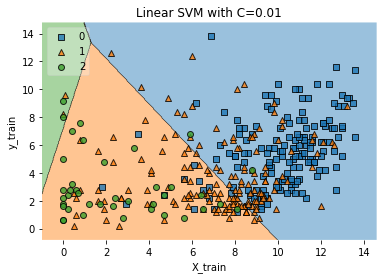

In [155]:
LinearSVM_comparison(df2,0.01)

the score is low 0.63. This model is hard to separate the data because the red and blue values overlapped a lot specially when
X values are high. 

# SVM for regression: 

The key difference between SVR and SVC is that SVR tries to find a function that approximates the training data within a certain margin. This margin is defined by two parameters: epsilon and C. Epsilon defines the width of the margin, and C controls the trade-off between maximizing the margin and minimizing the error

In general, SVR is quite similar to SVC, but there are some notable differences:

SVR has an additional tunable parameter ε (epsilon). The value of epsilon determines the width of the tube around the estimated function (hyperplane). Points that fall inside this tube are considered as correct predictions and are not penalized by the algorithm.
The support vectors are the points that fall outside the tube rather than just the ones at the margin, as seen in the SVM classification example.
Finally, “slack” (ξ ) measures the distance to points outside the tube, and you can control how much you care about it by tuning a regularization parameter C (more about it in the Python section below).

A simple way to think about SVR is to imagine a tube with an estimated function (hyperplane) in the middle and boundaries on either side defined by ε. The algorithm's goal is to minimize the error by identifying a function that puts more of the original points inside the tube while at the same time reducing the “slack.”

In [51]:
# Data Manipulation
import pandas as pd # for data manipulation
import numpy as np # for data manipulation

# Sklearn
from sklearn.linear_model import LinearRegression # for building a linear regression model
from sklearn.svm import SVR # for building SVR model
from sklearn.preprocessing import MinMaxScaler

# Visualizations
import plotly.graph_objects as go # for data visualization
import plotly.express as px # for data visualization

In [52]:
# Read in data
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Real estate.csv', encoding='utf-8')

In [53]:
df

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1
...,...,...,...,...,...,...,...,...
409,410,2013.000,13.7,4082.01500,0,24.94155,121.50381,15.4
410,411,2012.667,5.6,90.45606,9,24.97433,121.54310,50.0
411,412,2013.250,18.8,390.96960,7,24.97923,121.53986,40.6
412,413,2013.000,8.1,104.81010,5,24.96674,121.54067,52.5


In [54]:
# Use MinMax scaling on X2 and X3 features
scaler=MinMaxScaler()
df['X2 house age (scaled)']=scaler.fit_transform(df[['X2 house age']])
df['X3 distance to the nearest MRT station (scaled)']=scaler.fit_transform(df[['X3 distance to the nearest MRT station']])

# Print Dataframe
df

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area,X2 house age (scaled),X3 distance to the nearest MRT station (scaled)
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9,0.730594,0.009513
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2,0.445205,0.043809
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3,0.303653,0.083315
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8,0.303653,0.083315
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1,0.114155,0.056799
...,...,...,...,...,...,...,...,...,...,...
409,410,2013.000,13.7,4082.01500,0,24.94155,121.50381,15.4,0.312785,0.627820
410,411,2012.667,5.6,90.45606,9,24.97433,121.54310,50.0,0.127854,0.010375
411,412,2013.250,18.8,390.96960,7,24.97923,121.53986,40.6,0.429224,0.056861
412,413,2013.000,8.1,104.81010,5,24.96674,121.54067,52.5,0.184932,0.012596


SVR vs. simple linear regression — 1 independent variable
We will take ‘X3 distance to the nearest MRT station’ as our input (independent) variable and ‘Y house price of unit area’ as our output (dependent) variable and create a scatterplot to visualize the data.

In [55]:
# Create a scatter plot
fig = px.scatter(df, x=df['X3 distance to the nearest MRT station'], y=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="House Price Based on Distance from the Nearest MRT", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

As we can see from the graph above, there is a clear relationship between the two variables, with house price (per unit area) decreasing as the distance from the nearest MRT station increases.

In [56]:
# Note, we need X to be a 2D array, hence reshape
X=df['X3 distance to the nearest MRT station'].values.reshape(-1,1)
y=df['Y house price of unit area'].values

In [57]:
X

array([[  84.87882],
       [ 306.5947 ],
       [ 561.9845 ],
       [ 561.9845 ],
       [ 390.5684 ],
       [2175.03   ],
       [ 623.4731 ],
       [ 287.6025 ],
       [5512.038  ],
       [1783.18   ],
       [ 405.2134 ],
       [  90.45606],
       [ 492.2313 ],
       [2469.645  ],
       [1164.838  ],
       [ 579.2083 ],
       [ 292.9978 ],
       [ 350.8515 ],
       [ 368.1363 ],
       [  23.38284],
       [2275.877  ],
       [ 279.1726 ],
       [1360.139  ],
       [ 279.1726 ],
       [ 480.6977 ],
       [1487.868  ],
       [ 383.8624 ],
       [ 276.449  ],
       [ 557.478  ],
       [ 451.2438 ],
       [4519.69   ],
       [ 769.4034 ],
       [ 488.5727 ],
       [ 323.655  ],
       [ 205.367  ],
       [4079.418  ],
       [1935.009  ],
       [1360.139  ],
       [ 577.9615 ],
       [ 289.3248 ],
       [4082.015  ],
       [4066.587  ],
       [ 519.4617 ],
       [ 512.7871 ],
       [ 533.4762 ],
       [ 488.8193 ],
       [ 463.9623 ],
       [ 640.

In [58]:
# ------- Linear regression -------
model1 = LinearRegression()
lr = model1.fit(X, y)

# ------- Support Vector regression -------
model2 = SVR(kernel='rbf', C=1, epsilon=10) # set kernel and hyperparameters
svr = model2.fit(X, y)

In [59]:
# ------- Predict a range of values based on the models for visualization -------
# Create 100 evenly spaced points from smallest X to largest X
x_range = np.linspace(X.min(), X.max(), 100)

In [60]:
x_range

array([  23.38284   ,   88.68221535,  153.98159071,  219.28096606,
        284.58034141,  349.87971677,  415.17909212,  480.47846747,
        545.77784283,  611.07721818,  676.37659354,  741.67596889,
        806.97534424,  872.2747196 ,  937.57409495, 1002.8734703 ,
       1068.17284566, 1133.47222101, 1198.77159636, 1264.07097172,
       1329.37034707, 1394.66972242, 1459.96909778, 1525.26847313,
       1590.56784848, 1655.86722384, 1721.16659919, 1786.46597455,
       1851.7653499 , 1917.06472525, 1982.36410061, 2047.66347596,
       2112.96285131, 2178.26222667, 2243.56160202, 2308.86097737,
       2374.16035273, 2439.45972808, 2504.75910343, 2570.05847879,
       2635.35785414, 2700.65722949, 2765.95660485, 2831.2559802 ,
       2896.55535556, 2961.85473091, 3027.15410626, 3092.45348162,
       3157.75285697, 3223.05223232, 3288.35160768, 3353.65098303,
       3418.95035838, 3484.24973374, 3549.54910909, 3614.84848444,
       3680.1478598 , 3745.44723515, 3810.74661051, 3876.04598

In [61]:
x_range.shape

(100,)

In [62]:
# Predict y values for our set of X values
y_lr = model1.predict(x_range.reshape(-1, 1)) # Linear regression
y_svr = model2.predict(x_range.reshape(-1, 1)) # SVR

In [63]:
# Create a scatter plot
fig = px.scatter(df, x=df['X3 distance to the nearest MRT station'], y=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Add a best-fit line
fig.add_traces(go.Scatter(x=x_range, y=y_lr, name='Linear Regression', line=dict(color='limegreen')))
fig.add_traces(go.Scatter(x=x_range, y=y_svr, name='Support Vector Regression', line=dict(color='red')))
fig.add_traces(go.Scatter(x=x_range, y=y_svr+10, name='+epsilon', line=dict(color='red', dash='dot')))
fig.add_traces(go.Scatter(x=x_range, y=y_svr-10, name='-epsilon', line=dict(color='red', dash='dot')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="House Price Based on Distance from the Nearest MRT with Model Predictions (epsilon=10, C=1)", 
                             font=dict(color='black')))
# Update marker size
#fig.update_traces(marker=dict(size=3))

fig.show()

Visually we can see how support vector regression is much more flexible compared to linear regression. SVR can capture the slope change as the increase in the distance from the nearest MRT has a diminishing effect on a house's price.

Meanwhile, simple linear regression has only one slope parameter, meaning that it maintains the curve's steepness throughout, overestimating the relationship at higher distance values.

Let us now adjust the hyperparameter C, increasing it to 1000, and see how that affects the SVR model. Note, the Python code we use is identical to the one above apart from C=1000 instead of C=1. Here are the results visualized:

In [64]:
# ------- Support Vector regression -------
model3 = SVR(kernel='rbf', C=1000, epsilon=10) # set kernel and hyperparameters
svr = model3.fit(X, y)
y_svr = model3.predict(x_range.reshape(-1, 1)) # SVR

Also, we use the default ‘rbf’ (radial-basis function) kernel. Other choices available in sklearn’s SVR package are: ‘linear’, ‘poly’, ‘sigmoid’, and ‘precomputed’.

In [66]:

# Create a scatter plot
fig = px.scatter(df, x=df['X3 distance to the nearest MRT station'], y=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Add a best-fit line
fig.add_traces(go.Scatter(x=x_range, y=y_lr, name='Linear Regression', line=dict(color='limegreen')))
fig.add_traces(go.Scatter(x=x_range, y=y_svr, name='Support Vector Regression', line=dict(color='red')))
fig.add_traces(go.Scatter(x=x_range, y=y_svr+10, name='+epsilon', line=dict(color='red', dash='dot')))
fig.add_traces(go.Scatter(x=x_range, y=y_svr-10, name='-epsilon', line=dict(color='red', dash='dot')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="House Price Based on Distance from the Nearest MRT with Model Predictions (epsilon=10, C=1000)", 
                             font=dict(color='black')))
# Update marker size
#fig.update_traces(marker=dict(size=3))

fig.show()

You will note how increasing C to 1000 created a much more “wavy” best-fit line. By increasing C's value, we told the algorithm that we care a lot more about minimizing the “slack.” The algorithm responded to this by capturing more points inside the epsilon-tube.

While increasing C allows us to fit the data better, it also makes our model less robust, risking overfitting. Hence, it is best to be cautious when tuning hyperparameters and split the data into training and testing datasets so you can evaluate your model with unseen data.

# SVR vs. multiple linear regression — 2 independent variables

Let’s now take a look at another example using multiple independent variables.

Given that SVR relies on distances between data points, it is beneficial to scale independent variables to ensure that they fit into the same range. Without scaling, we would have the most variation along the dimension with the highest range, leading to a worse prediction model.

We start by creating a 3D scatterplot with the scaled versions of ‘X3 distance to the nearest MRT station’ and ‘X2 house age’ as our independent variables.

In [67]:
# Create a 3D scatter plot
fig = px.scatter_3d(df, 
                    x=df['X3 distance to the nearest MRT station (scaled)'], 
                    y=df['X2 house age (scaled)'], 
                    z=df['Y house price of unit area'], 
                    opacity=0.8, color_discrete_sequence=['black'],
                    height=900, width=1000
                   )

# Set figure title
fig.update_layout(title_text="Scatter 3D Plot",
                  scene_camera_eye=dict(x=1.5, y=1.5, z=0.25), 
                  scene_camera_center=dict(x=0, y=0, z=-0.2),
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'
                                          ),
                               zaxis=dict(backgroundcolor='white',
                                          color='black', 
                                          gridcolor='lightgrey')))

# Update marker size
fig.update_traces(marker=dict(size=2))

fig.show()

We can see from the graph that the house price tends to increase as the house age decreases. Although the relationship between X2 and Y is not as strong as the one between X3 and Y, it will still improve our model.

Let us now fit the two models and create a prediction plane. This time we use the following hyperparameters for the SVR model: epsilon = 1, C = 100. Note that we do not go through hyperparameter tuning in these examples. This means that the above hyperparameters may not be ideal for this model. Therefore, you should train and test multiple versions of the model to identify more optimal hyperparameter values.

In [68]:
# ----------- Select variables -----------
X=df[['X3 distance to the nearest MRT station (scaled)','X2 house age (scaled)']]
y=df['Y house price of unit area'].values

In [69]:
# ----------- Model fitting -----------
# Define models and set hyperparameter values
model1 = LinearRegression()
model2 = SVR(kernel='rbf', C=100, epsilon=1)

In [70]:
# Fit the two models 
lr = model1.fit(X, y)
svr = model2.fit(X, y)

In [71]:
# ----------- For creating a prediciton plane to be used in the visualization -----------
# Set Increments between points in a meshgrid
mesh_size = 0.05

# Identify min and max values for input variables
x_min, x_max = X['X3 distance to the nearest MRT station (scaled)'].min(), X['X3 distance to the nearest MRT station (scaled)'].max()
y_min, y_max = X['X2 house age (scaled)'].min(), X['X2 house age (scaled)'].max()

# Return evenly spaced values based on a range between min and max
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)

# Create a meshgrid
xx, yy = np.meshgrid(xrange, yrange)

# ----------- Create a prediciton plane  -----------
# Use models to create a prediciton plane --- Linear Regression
pred_LR = model1.predict(np.c_[xx.ravel(), yy.ravel()])
pred_LR = pred_LR.reshape(xx.shape)

# Use models to create a prediciton plane --- SVR
pred_svr = model2.predict(np.c_[xx.ravel(), yy.ravel()])
pred_svr = pred_svr.reshape(xx.shape)

# Note, .ravel() flattens the array to a 1D array,
# then np.c_ takes elements from flattened xx and yy arrays and puts them together,
# this creates the right shape required for model input

# prediction array that is created by the model output is a 1D array,
# Hence, we need to reshape it to be the same shape as xx or yy to be able to display it on a graph

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names



In [72]:
# Create a 3D scatter plot with predictions
fig = px.scatter_3d(df, x=df['X3 distance to the nearest MRT station (scaled)'], y=df['X2 house age (scaled)'], z=df['Y house price of unit area'], 
                    opacity=0.8, color_discrete_sequence=['black'],
                    width=1000, height=900
                   )

# Set figure title and colors
fig.update_layout(title_text="Scatter 3D Plot with Linear Regression Prediction Surface",
                  scene_camera_eye=dict(x=1.5, y=1.5, z=0.25), 
                  scene_camera_center=dict(x=0, y=0, z=-0.2),
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'
                                          ),
                               zaxis=dict(backgroundcolor='white',
                                          color='black', 
                                          gridcolor='lightgrey')))
# Update marker size
fig.update_traces(marker=dict(size=2))

# Add prediction plane
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred_LR, name='LR', 
                          colorscale=px.colors.sequential.Sunsetdark, showscale=False))

fig.show()

In [73]:
# Create a 3D scatter plot with predictions
fig = px.scatter_3d(df, x=df['X3 distance to the nearest MRT station (scaled)'], y=df['X2 house age (scaled)'], z=df['Y house price of unit area'], 
                    opacity=0.8, color_discrete_sequence=['black'],
                    width=1000, height=900
                   )

# Set figure title and colors
fig.update_layout(title_text="Scatter 3D Plot with SVR Prediction Surface, C=100, epsilon=1",
                  scene_camera_eye=dict(x=1.5, y=1.5, z=0.25), 
                  scene_camera_center=dict(x=0, y=0, z=-0.2),
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'
                                          ),
                               zaxis=dict(backgroundcolor='white',
                                          color='black', 
                                          gridcolor='lightgrey')))
# Update marker size
fig.update_traces(marker=dict(size=2))

# Add prediction plane
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred_svr, name='SVR',
                          colorscale=px.colors.sequential.Sunsetdark,
                          showscale=False))

fig.show()

It is easy to see the difference between the two models. Multiple linear regression creates a prediction plane that looks like a flat sheet of paper. Meanwhile, SVR is more like a soft fabric that you can bend and fold in whatever way you need to fit your data better. This gives you a lot more flexibility and enables you to get a more accurate model.

z = the predictions of the model that are the price of the house. 

Conclusion
Support vector regression algorithm is a huge improvement over simple linear regression. It allows you to build non-linear models and gives you control over the flexibility vs. robustness of your models.

As long as you are willing to spend a little bit of time tuning hyperparameters and evaluating model performance on the test samples, you will be able to get some excellent results.

In [223]:
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'epsilon': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(svr, param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X, y)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ......C=0.1, epsilon=1, kernel=rbf;, score=0.268 total time=   0.0s
[CV 2/5] END ......C=0.1, epsilon=1, kernel=rbf;, score=0.215 total time=   0.0s
[CV 3/5] END ......C=0.1, epsilon=1, kernel=rbf;, score=0.231 total time=   0.0s
[CV 4/5] END ......C=0.1, epsilon=1, kernel=rbf;, score=0.159 total time=   0.0s
[CV 5/5] END ......C=0.1, epsilon=1, kernel=rbf;, score=0.275 total time=   0.0s
[CV 1/5] END ....C=0.1, epsilon=0.1, kernel=rbf;, score=0.270 total time=   0.0s
[CV 2/5] END ....C=0.1, epsilon=0.1, kernel=rbf;, score=0.212 total time=   0.0s
[CV 3/5] END ....C=0.1, epsilon=0.1, kernel=rbf;, score=0.229 total time=   0.0s
[CV 4/5] END ....C=0.1, epsilon=0.1, kernel=rbf;, score=0.159 total time=   0.0s
[CV 5/5] END ....C=0.1, epsilon=0.1, kernel=rbf;, score=0.276 total time=   0.0s
[CV 1/5] END ...C=0.1, epsilon=0.01, kernel=rbf;, score=0.268 total time=   0.0s
[CV 2/5] END ...C=0.1, epsilon=0.01, kernel=rbf

[CV 3/5] END .....C=1000, epsilon=1, kernel=rbf;, score=0.688 total time=   0.0s
[CV 4/5] END .....C=1000, epsilon=1, kernel=rbf;, score=0.444 total time=   0.0s
[CV 5/5] END .....C=1000, epsilon=1, kernel=rbf;, score=0.631 total time=   0.0s
[CV 1/5] END ...C=1000, epsilon=0.1, kernel=rbf;, score=0.721 total time=   0.0s
[CV 2/5] END ...C=1000, epsilon=0.1, kernel=rbf;, score=0.560 total time=   0.0s
[CV 3/5] END ...C=1000, epsilon=0.1, kernel=rbf;, score=0.686 total time=   0.0s
[CV 4/5] END ...C=1000, epsilon=0.1, kernel=rbf;, score=0.440 total time=   0.0s
[CV 5/5] END ...C=1000, epsilon=0.1, kernel=rbf;, score=0.643 total time=   0.0s
[CV 1/5] END ..C=1000, epsilon=0.01, kernel=rbf;, score=0.721 total time=   0.0s
[CV 2/5] END ..C=1000, epsilon=0.01, kernel=rbf;, score=0.557 total time=   0.0s
[CV 3/5] END ..C=1000, epsilon=0.01, kernel=rbf;, score=0.685 total time=   0.0s
[CV 4/5] END ..C=1000, epsilon=0.01, kernel=rbf;, score=0.438 total time=   0.0s
[CV 5/5] END ..C=1000, epsil

GridSearchCV(estimator=SVR(C=100, epsilon=1),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'epsilon': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [224]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning. As the one we have used. 
print(grid.best_estimator_)

{'C': 100, 'epsilon': 1, 'kernel': 'rbf'}
SVR(C=100, epsilon=1)


#by coincidence we use the same optimal parameters when I create the second model SVR. 
model2 = SVR(kernel='rbf', C=100, epsilon=1)

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [76]:
print("training set score: %f" % model2.score(X_train, y_train))
print("test set score: %f" % model2.score(X_test, y_test))

training set score: 0.627273
test set score: 0.624476


Even with parameters optimization the scores are not high. The feautres are not enough to predict the target variable or they are
not correlated with the dependent variable in order to use them as predictors. 

In [225]:
#1 Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [239]:
#2 Importing the dataset
dataset = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Salaries_per_position.csv')
X = dataset.iloc[:,1:2].values.astype(float)
y = dataset.iloc[:,2:3].values.astype(float)

In [240]:
X

array([[ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 5.],
       [ 6.],
       [ 7.],
       [ 8.],
       [ 9.],
       [10.]])

In [241]:
y

array([[  45000.],
       [  50000.],
       [  60000.],
       [  80000.],
       [ 110000.],
       [ 150000.],
       [ 200000.],
       [ 300000.],
       [ 500000.],
       [1000000.]])

In [242]:
#3 Feature Scaling
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(y)

In [248]:
X

array([[-1.5666989 ],
       [-1.21854359],
       [-0.87038828],
       [-0.52223297],
       [-0.17407766],
       [ 0.17407766],
       [ 0.52223297],
       [ 0.87038828],
       [ 1.21854359],
       [ 1.5666989 ]])

In [243]:
#4 Fitting the Support Vector Regression Model to the dataset
# Create your support vector regressor here
from sklearn.svm import SVR

In [234]:
X = X.reshape(-1, 1)
X

array([[-1.5666989 ],
       [-1.21854359],
       [-0.87038828],
       [-0.52223297],
       [-0.17407766],
       [ 0.17407766],
       [ 0.52223297],
       [ 0.87038828],
       [ 1.21854359],
       [ 1.5666989 ]])

In [251]:
y

array([[-0.72004253],
       [-0.70243757],
       [-0.66722767],
       [-0.59680786],
       [-0.49117815],
       [-0.35033854],
       [-0.17428902],
       [ 0.17781001],
       [ 0.88200808],
       [ 2.64250325]])

In [236]:
y = y.reshape(-1, 1)

most important SVR parameter is Kernel type. It can be #linear,polynomial or gaussian SVR. We have a non-linear condition #so we can select polynomial or gaussian but here we select RBF(a #gaussian type) kernel.

In [244]:
regressor = SVR(kernel='rbf')
regressor.fit(X,y)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



SVR()

In [249]:
#5 Predicting a new result
y_pred = regressor.predict([[6.5]])

In [250]:
y_pred

array([0.01158103])

This is not the value that we were expecting since the data has been regularized. 

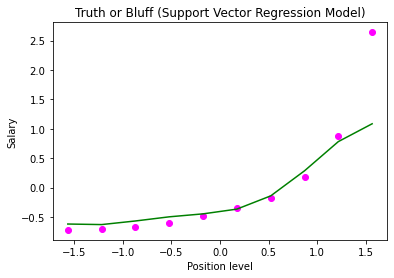

In [254]:
#6 Visualising the Support Vector Regression results
plt.scatter(X, y, color = 'magenta')
plt.plot(X, regressor.predict(X), color = 'green')
plt.title('Truth or Bluff (Support Vector Regression Model)')
plt.xlabel('Position level')
plt.ylabel('Salary')
plt.show()

In [269]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVR

In [270]:
# generate synthetic data
X = np.sort(5 * np.random.rand(40, 1),
            axis=0)

In [271]:
X

array([[0.07973106],
       [0.19167633],
       [0.32141386],
       [0.40165057],
       [0.64046736],
       [0.76494882],
       [0.82468222],
       [0.85674413],
       [0.9417068 ],
       [1.03525099],
       [1.24239971],
       [1.42477548],
       [1.53504518],
       [1.54447584],
       [1.68371887],
       [1.93056189],
       [1.96107344],
       [2.14489926],
       [2.14824715],
       [2.41466057],
       [2.62080194],
       [2.67651001],
       [2.77803352],
       [2.95207317],
       [2.98189805],
       [2.98429722],
       [2.9946586 ],
       [3.00555987],
       [3.03301681],
       [3.12308324],
       [3.17437364],
       [3.73427178],
       [4.10234142],
       [4.17686306],
       [4.1831829 ],
       [4.25935543],
       [4.42379327],
       [4.79354336],
       [4.87477132],
       [4.96364893]])

In [272]:
X.shape

(40, 1)

In [275]:
y = np.sin(X).ravel()
y

array([ 0.07964661,  0.1905048 ,  0.31590834,  0.39093808,  0.59757024,
        0.69250008,  0.73433211,  0.7557143 ,  0.80856357,  0.85999046,
        0.94656069,  0.98935789,  0.999361  ,  0.99965364,  0.99363102,
        0.93597938,  0.92480367,  0.83967982,  0.83785694,  0.66458037,
        0.49756618,  0.44849667,  0.35560298,  0.188387  ,  0.1590167 ,
        0.1566476 ,  0.14640592,  0.13561362,  0.10836265,  0.01850836,
       -0.03277512, -0.55858522, -0.81962077, -0.86000037, -0.86320815,
       -0.89912347, -0.95864449, -0.99670879, -0.98684493, -0.96859994])

In [277]:
y[::5]

array([-1.27546841, -0.50492942, -0.11749703,  0.7882915 ,  1.08503067,
       -0.87454998, -0.1088252 , -2.06980103])

In [276]:
# add some noise to the data
y[::5] += 3 * (0.5 - np.random.rand(8))

In [278]:
# create an SVR model with a linear kernel
svr = SVR(kernel='linear')
  
# train the model on the data
svr.fit(X, y)
  
# make predictions on the data
y_pred = svr.predict(X)

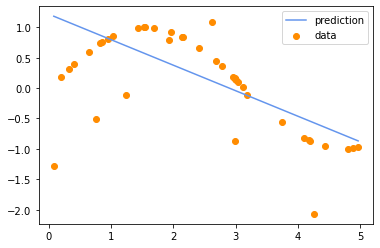

In [279]:
# plot the predicted values against the true values
plt.scatter(X, y, color='darkorange',
            label='data')
plt.plot(X, y_pred, color='cornflowerblue',
         label='prediction')
plt.legend()
plt.show()

The linear model is not a good choice to fit the data. 

Fitting an SVR Model on the Sine Curve data using Polynomial Kernel
Now we will fit a Support vector Regression model using a polynomial kernel. This will be hopefully a little better than the SVR model with a linear kernel.

In [280]:
# create an SVR model with a linear kernel
svr = SVR(kernel='poly')
  
# train the model on the data
svr.fit(X, y)
  
# make predictions on the data
y_pred = svr.predict(X)

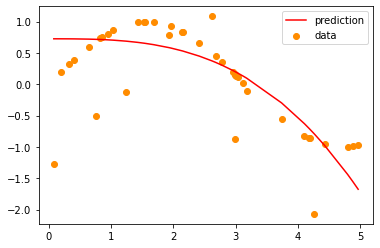

In [281]:
    # plot the predicted values against the true values
plt.scatter(X, y, color='darkorange',
            label='data')
plt.plot(X, y_pred, color='red',
         label='prediction')
plt.legend()
plt.show()

Fitting an SVR Model on the Sine Curve data using RBF Kernel
Now we will fit a Support vector Regression model using an RBF(Radial Basis Function) kernel. This will help us to achieve probably the best results as the RBF kernel is one of the best kernels which helps us to introduce non-linearity in our model.

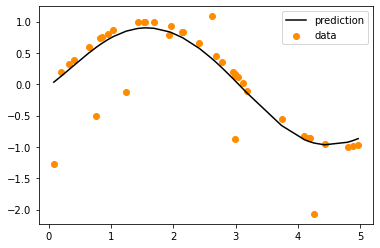

In [282]:
# create an SVR model with a linear kernel
svr = SVR(kernel='rbf')
  
# train the model on the data
svr.fit(X, y)
  
# make predictions on the data
y_pred = svr.predict(X)
  
# plot the predicted values against the true values
plt.scatter(X, y, color='darkorange',
            label='data')
plt.plot(X, y_pred, color='black',
         label='prediction')
plt.legend()
plt.show()

the best model was the RBF. 

In [286]:
#new input
svr.predict([[2.8]])

array([0.24195029])

In [288]:
#new input
svr.predict([[0.5]])

array([0.38288924])

In [324]:
#importing the libraries 
import numpy as np
import pandas as pd

In [357]:
#importing the dataset
dataset = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/wineQualityReds.csv')

In [358]:
dataset

,Unnamed: 0,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
0,1,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,2,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,3,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,4,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,5,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,1595,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,1596,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,1597,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,1598,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [359]:
# Removing the unnecessary column
dataset.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [360]:
dataset.head(5)

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [361]:
# seprating the dataset
X = X = dataset.iloc[:, :-1].values
y = dataset.iloc[:, -1:].values

In [362]:
y

array([[5],
       [5],
       [5],
       ...,
       [6],
       [5],
       [6]], dtype=int64)

In [363]:
# Spliting the datdset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size=0.2, random_state=0)

In [364]:
from sklearn.preprocessing import StandardScaler
X_sc = StandardScaler()
y_sc = StandardScaler()
X_train = X_sc.fit_transform(X_train)
y_train = y_sc.fit_transform(y_train)

In [365]:
from sklearn.svm import SVR
regrassor = SVR(kernel = 'rbf')
regrassor.fit(X_train, y_train)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



SVR()

In [366]:
y_pred = regrassor.predict(X_sc.transform(X_test).reshape(-1, 11))
#to have the original values due to regularization. 
y_pred = y_sc.inverse_transform([y_pred])

In [367]:
y_pred

array([[5.27657039, 5.23344537, 7.0591123 , 4.88298083, 6.02985861,
        5.16844228, 5.09534411, 5.91807774, 5.09352653, 5.05285968,
        5.00394715, 5.45790685, 5.61369609, 5.49082197, 5.45383823,
        6.42276497, 6.9179531 , 5.40141652, 5.5207422 , 5.28588316,
        6.05735683, 5.26062604, 5.71606958, 5.79081873, 5.40079229,
        5.11055245, 5.19434953, 6.85817946, 4.97586951, 6.0650165 ,
        5.88773638, 5.91509646, 5.69149272, 5.43255309, 6.08671688,
        5.97947399, 5.28341964, 5.72299932, 6.16976622, 5.92214816,
        5.20223519, 6.66536286, 6.40407906, 6.49881593, 5.94396563,
        5.01181162, 5.10213712, 5.79763974, 5.06932804, 5.95556354,
        4.83741485, 5.15227781, 6.01112894, 6.08192986, 5.44582797,
        5.24411055, 4.9141735 , 5.1583012 , 6.73832758, 5.67744773,
        5.01745452, 5.90158303, 6.09155239, 5.82266212, 5.12969939,
        6.13971514, 5.16678155, 5.07371452, 6.32246457, 6.0682078 ,
        5.28703725, 5.24289344, 5.05587833, 5.25

In [368]:
y_test

array([[6],
       [5],
       [7],
       [6],
       [5],
       [6],
       [5],
       [6],
       [4],
       [5],
       [5],
       [5],
       [6],
       [5],
       [6],
       [6],
       [7],
       [5],
       [5],
       [4],
       [7],
       [6],
       [6],
       [4],
       [6],
       [5],
       [5],
       [7],
       [5],
       [6],
       [5],
       [6],
       [5],
       [6],
       [7],
       [7],
       [5],
       [6],
       [6],
       [7],
       [5],
       [7],
       [6],
       [6],
       [5],
       [5],
       [6],
       [6],
       [6],
       [5],
       [5],
       [5],
       [6],
       [6],
       [6],
       [5],
       [5],
       [5],
       [6],
       [5],
       [5],
       [6],
       [6],
       [6],
       [5],
       [6],
       [5],
       [5],
       [6],
       [6],
       [6],
       [6],
       [4],
       [6],
       [5],
       [6],
       [5],
       [5],
       [5],
       [6],
       [6],
       [5],
       [6],
    

In [371]:
y_test = y_test.flatten()
y_test

array([6, 5, 7, 6, 5, 6, 5, 6, 4, 5, 5, 5, 6, 5, 6, 6, 7, 5, 5, 4, 7, 6,
       6, 4, 6, 5, 5, 7, 5, 6, 5, 6, 5, 6, 7, 7, 5, 6, 6, 7, 5, 7, 6, 6,
       5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 6, 6, 6, 6, 4, 6, 5, 6, 5, 5, 5, 6, 6, 5, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 6, 4, 5, 7, 6, 6, 5, 6, 5, 8, 6, 6, 6, 5, 5, 5, 5, 7, 5,
       6, 5, 7, 5, 6, 6, 6, 7, 6, 6, 5, 7, 5, 5, 6, 6, 5, 5, 5, 6, 6, 6,
       6, 6, 6, 5, 6, 5, 8, 5, 6, 5, 6, 5, 4, 6, 7, 6, 5, 6, 6, 5, 5, 5,
       6, 6, 3, 6, 6, 6, 6, 6, 6, 6, 5, 5, 6, 6, 6, 6, 5, 5, 5, 8, 5, 6,
       6, 7, 7, 5, 5, 7, 5, 6, 6, 4, 5, 6, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 6, 6, 5, 6, 7, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 6, 5, 6, 6, 6, 3, 6, 5, 5, 7, 6, 7, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 5, 5, 6, 7, 5, 6, 5, 6,
       5, 4, 5, 5, 6, 7, 6, 5, 5, 4, 5, 6, 7, 6, 6, 7, 5, 7, 5, 6, 6, 5,
       5, 5, 6, 6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 5, 6,

In [372]:
y_pred = y_pred.flatten()
y_pred

array([5.27657039, 5.23344537, 7.0591123 , 4.88298083, 6.02985861,
       5.16844228, 5.09534411, 5.91807774, 5.09352653, 5.05285968,
       5.00394715, 5.45790685, 5.61369609, 5.49082197, 5.45383823,
       6.42276497, 6.9179531 , 5.40141652, 5.5207422 , 5.28588316,
       6.05735683, 5.26062604, 5.71606958, 5.79081873, 5.40079229,
       5.11055245, 5.19434953, 6.85817946, 4.97586951, 6.0650165 ,
       5.88773638, 5.91509646, 5.69149272, 5.43255309, 6.08671688,
       5.97947399, 5.28341964, 5.72299932, 6.16976622, 5.92214816,
       5.20223519, 6.66536286, 6.40407906, 6.49881593, 5.94396563,
       5.01181162, 5.10213712, 5.79763974, 5.06932804, 5.95556354,
       4.83741485, 5.15227781, 6.01112894, 6.08192986, 5.44582797,
       5.24411055, 4.9141735 , 5.1583012 , 6.73832758, 5.67744773,
       5.01745452, 5.90158303, 6.09155239, 5.82266212, 5.12969939,
       6.13971514, 5.16678155, 5.07371452, 6.32246457, 6.0682078 ,
       5.28703725, 5.24289344, 5.05587833, 5.255232  , 5.63018

In [373]:
df = pd.DataFrame({'Predicted value': y_pred, 'Real Value': y_test})
df

,Predicted value,Real Value
0,5.276570,6
1,5.233445,5
2,7.059112,7
3,4.882981,6
4,6.029859,5
...,...,...
315,6.251384,6
316,5.972299,4
317,6.294503,5
318,5.388618,4


In [374]:
X_test.shape

(320, 11)

In [376]:
y_pred.shape

(320,)

In [379]:
X_test[0][0]

10.8

In [387]:
X_test_fixed_acidity = []
for v in range(320):
    X_test_fixed_acidity.append(X_test[v][0])

In [389]:
X_test[1][0]

8.1

In [390]:
X_test_fixed_acidity

[10.8,
 8.1,
 9.1,
 10.2,
 12.2,
 8.2,
 9.3,
 9.3,
 8.8,
 7.1,
 8.6,
 9.6,
 9.4,
 5.0,
 5.4,
 7.5,
 8.2,
 9.4,
 6.3,
 7.4,
 7.1,
 9.0,
 7.5,
 6.0,
 6.4,
 7.7,
 9.0,
 7.3,
 8.6,
 5.1,
 10.2,
 8.3,
 6.9,
 7.4,
 6.6,
 10.4,
 6.2,
 6.9,
 5.9,
 7.3,
 8.5,
 7.2,
 5.0,
 13.8,
 7.6,
 8.0,
 7.7,
 8.4,
 7.5,
 8.0,
 6.2,
 5.2,
 6.8,
 13.0,
 10.1,
 7.5,
 7.8,
 9.9,
 10.5,
 9.0,
 6.9,
 7.6,
 6.9,
 6.3,
 7.4,
 6.6,
 7.2,
 15.6,
 10.4,
 10.9,
 9.6,
 7.9,
 8.1,
 7.6,
 6.8,
 6.0,
 6.4,
 7.1,
 7.5,
 7.2,
 12.2,
 8.0,
 6.2,
 9.7,
 6.8,
 7.3,
 6.5,
 9.3,
 7.5,
 7.2,
 8.8,
 8.8,
 6.5,
 7.2,
 7.5,
 9.6,
 8.8,
 12.3,
 7.8,
 10.6,
 10.3,
 7.1,
 8.2,
 6.7,
 6.9,
 7.4,
 6.9,
 6.8,
 6.6,
 8.3,
 5.9,
 8.7,
 7.2,
 6.6,
 7.9,
 8.6,
 8.3,
 9.4,
 8.3,
 7.5,
 9.2,
 12.0,
 8.5,
 7.4,
 7.2,
 9.1,
 9.2,
 11.6,
 8.5,
 10.5,
 7.2,
 7.0,
 7.6,
 8.0,
 11.5,
 8.8,
 13.7,
 8.9,
 12.6,
 6.0,
 7.1,
 8.2,
 7.7,
 7.2,
 7.6,
 10.9,
 7.2,
 10.4,
 8.6,
 7.0,
 7.1,
 8.2,
 6.8,
 9.0,
 7.3,
 6.9,
 11.6,
 8.6,
 6.6,
 10.2,
 6.2,
 6.9,
 1

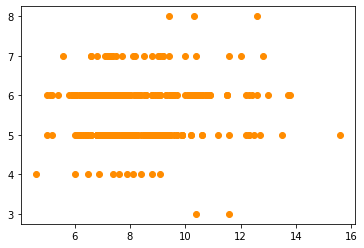

In [392]:
# plot the predicted values against the true values
plt.scatter(X_test_fixed_acidity, y_test, color='darkorange',
            label='test_data')

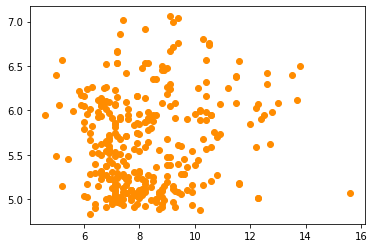

In [393]:
# plot the predicted values against the true values
plt.scatter(X_test_fixed_acidity, y_pred, color='darkorange',
            label='test_data')

In [398]:
from sklearn.metrics import mean_squared_error

the score are really bad you can realize by seeing the chart that is not linear at all. One reason may be that I scaled
the test data and in machine learning we use to only scale the X data, the predictors. 

In [399]:
score = regrassor.score(X_test,y_test)
print("R-squared:", score)
print("MSE:", mean_squared_error(y_test,y_pred))

R-squared: -58.64019387078573
MSE: 0.37325969380095064


In [400]:
np.random.seed(21)

N = 1000    
def makeData(x):    
    r = [a/10 for a in x]
    y = np.sin(x)+np.random.uniform(-.5, .2, len(x))
    return np.array(y+r)

x = [i/100 for i in range(N)]
y = makeData(x)

In [404]:
x = np.array(x).reshape(-1,1)

In [405]:
x

array([[0.  ],
       [0.01],
       [0.02],
       [0.03],
       [0.04],
       [0.05],
       [0.06],
       [0.07],
       [0.08],
       [0.09],
       [0.1 ],
       [0.11],
       [0.12],
       [0.13],
       [0.14],
       [0.15],
       [0.16],
       [0.17],
       [0.18],
       [0.19],
       [0.2 ],
       [0.21],
       [0.22],
       [0.23],
       [0.24],
       [0.25],
       [0.26],
       [0.27],
       [0.28],
       [0.29],
       [0.3 ],
       [0.31],
       [0.32],
       [0.33],
       [0.34],
       [0.35],
       [0.36],
       [0.37],
       [0.38],
       [0.39],
       [0.4 ],
       [0.41],
       [0.42],
       [0.43],
       [0.44],
       [0.45],
       [0.46],
       [0.47],
       [0.48],
       [0.49],
       [0.5 ],
       [0.51],
       [0.52],
       [0.53],
       [0.54],
       [0.55],
       [0.56],
       [0.57],
       [0.58],
       [0.59],
       [0.6 ],
       [0.61],
       [0.62],
       [0.63],
       [0.64],
       [0.65],
       [0.

In [406]:
y

array([-4.65892583e-01, -2.86623405e-01,  2.66751095e-02, -4.51873125e-01,
       -3.11864730e-01, -4.09479551e-01, -2.22445668e-01,  4.16800536e-02,
       -1.96405231e-01,  7.39244255e-03, -3.41466915e-01,  2.27961440e-01,
       -2.75019429e-01, -2.32678594e-01,  6.93799523e-04,  2.69027884e-01,
        2.06578891e-01,  3.65521937e-01,  2.28541360e-01, -2.31660826e-02,
        4.77216141e-03,  2.28812199e-01, -7.03015360e-02,  3.48849534e-01,
        4.00917405e-01,  3.04933208e-01,  1.44748528e-01, -8.87835277e-02,
        1.34402527e-02,  1.37123566e-02,  5.45690103e-02,  1.58156870e-01,
        2.27624412e-01,  9.22363723e-03,  4.27394921e-01,  3.86576922e-01,
        4.82779133e-01,  8.58806952e-02,  3.39297767e-01,  3.76117666e-01,
        2.00189846e-01,  2.26857253e-01,  5.16870738e-01,  3.80129288e-01,
        5.98777702e-01,  3.22988092e-01,  5.69770800e-01,  6.01108915e-01,
        5.61690776e-01,  6.40984694e-01,  5.18628091e-01,  3.57250462e-01,
        2.63020753e-01,  

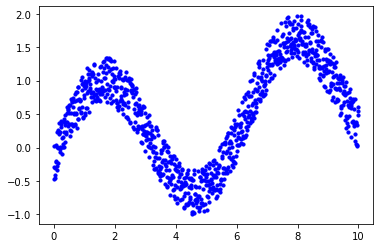

In [407]:
plt.scatter(x, y, s=10, color="blue")
plt.show()

Model fitting and prediction, with the default prediction. 

In [408]:
svr = SVR().fit(x, y)
print(svr)

SVR()


In [409]:
yfit = svr.predict(x)

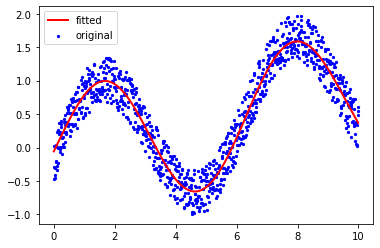

In [410]:
plt.scatter(x, y, s=5, color="blue", label="original")
plt.plot(x, yfit, lw=2, color="red", label="fitted")
plt.legend()
plt.show()

# Look at the flexibility of the SVR compare to our regression model, it is amazing the way it adapts to non-linearm models.You can realize just by seeing the high score 0.92. 

In [411]:
score = svr.score(x,y)
print("R-squared:", score)
print("MSE:", mean_squared_error(y, yfit))

R-squared: 0.9201610722643554
MSE: 0.041676600207571246


In [412]:
# get the dataset
dataset = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Salaries_per_position.csv')
dataset

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [413]:
# split the data into featutes and target variable seperately
X_l = dataset.iloc[:, 1:-1].values # features set
y_p = dataset.iloc[:, -1].values # set of study variable

In [415]:
X_l

array([[ 1],
       [ 2],
       [ 3],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 8],
       [ 9],
       [10]], dtype=int64)

In [416]:
y_p

array([  45000,   50000,   60000,   80000,  110000,  150000,  200000,
        300000,  500000, 1000000], dtype=int64)

The challenge here is that the StandardScaler, the class we use to scale the data, takes in a 2D array; otherwise, it returns an error.

Due to this, we have to reshape our y_p variable from 1D to 2D. The code below does this for us:

In [417]:
y_p = y_p.reshape(-1,1)
y_p

array([[  45000],
       [  50000],
       [  60000],
       [  80000],
       [ 110000],
       [ 150000],
       [ 200000],
       [ 300000],
       [ 500000],
       [1000000]], dtype=int64)

In [418]:
from sklearn.preprocessing import StandardScaler
StdS_X = StandardScaler()
StdS_y = StandardScaler()
X_l = StdS_X.fit_transform(X_l)
y_p = StdS_y.fit_transform(y_p)

In [419]:
print("Scaled X_l:")
print(X_l)
print("Scaled y_p:")
print(y_p)

Scaled X_l:
[[-1.5666989 ]
 [-1.21854359]
 [-0.87038828]
 [-0.52223297]
 [-0.17407766]
 [ 0.17407766]
 [ 0.52223297]
 [ 0.87038828]
 [ 1.21854359]
 [ 1.5666989 ]]
Scaled y_p:
[[-0.72004253]
 [-0.70243757]
 [-0.66722767]
 [-0.59680786]
 [-0.49117815]
 [-0.35033854]
 [-0.17428902]
 [ 0.17781001]
 [ 0.88200808]
 [ 2.64250325]]


In [420]:
X_l.min()

-1.5666989036012806

In [421]:
X_l.max()

1.5666989036012806

In [422]:
y_p.min()

-0.7200425251772663

In [423]:
y_p.max()

2.6425032525454197

However, before we can do so, we will first visualize the data to know the nature of the SVR model that best fits it. So, let us create a scatter plot of our two variables.

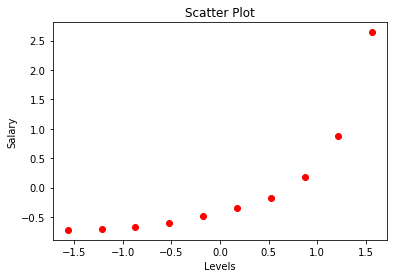

In [424]:
plt.scatter(X_l, y_p, color = 'red') # plotting the training set
plt.title('Scatter Plot') # adding a tittle to our plot
plt.xlabel('Levels') # adds a label to the x-axis
plt.ylabel('Salary') # adds a label to the y-axis
plt.show() # prints

Since we declared our data to be non-linear, we will pass it to a kernel called the Radial Basis function (RBF) kernel.

In [425]:
# import the model
from sklearn.svm import SVR
# create the model object
regressor = SVR(kernel = 'rbf')
# fit the model on the data
regressor.fit(X_l, y_p)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



SVR()

In [426]:
A=regressor.predict(StdS_X.transform([[6.5]]))
print(A)

[-0.27861589]


As we can see, the model prediction values are for the scaled study variable. But, the required value for the business is the output of the unscaled data. So, we need to get back to the real scale of the study variable.

However, as we can recall, we had reshaped our study variable from 1D to 2D array since the StandarScaler method takes in only 2D arrays.

So, for any predicted value to fit within such a new dimension of the study variable, it must be transformed from 1D to 2D; otherwise, we will get an error.

So, let’s implement these commands and get the required value:

In [427]:
# Convert A to 2D
A = A.reshape(-1,1)
print(A)

[[-0.27861589]]


It is clear from the output above is a 2D array. Using the inverse_transform() function, we can convert it to an unscaled value in the original dataset as shown:

In [428]:
# Taking the inverse of the scaled value
A_pred = StdS_y.inverse_transform(A)
print(A_pred)

[[170370.0204065]]


In [429]:
#one single code. 
B_pred = StdS_y.inverse_transform(regressor.predict(StdS_X.transform([[8.5]])).reshape(-1,1))
print(B_pred)

[[403162.81672181]]


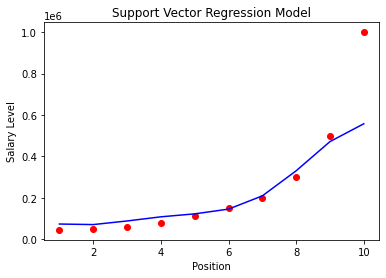

In [430]:
# inverse the transformation to go back to the initial scale
plt.scatter(StdS_X.inverse_transform(X_l), StdS_y.inverse_transform(y_p), color = 'red')
plt.plot(StdS_X.inverse_transform(X_l), StdS_y.inverse_transform(regressor.predict(X_l).reshape(-1,1)), color = 'blue')
# add the title to the plot
plt.title('Support Vector Regression Model')
# label x axis
plt.xlabel('Position')
# label y axis
plt.ylabel('Salary Level')
# print the plot
plt.show()

# SVR vs. multiple linear regression — 2 independent variables

In [78]:
# Read in data
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Real estate.csv', encoding='utf-8')

# Use MinMax scaling on X2 and X3 features
scaler=MinMaxScaler()
df['X2 house age (scaled)']=scaler.fit_transform(df[['X2 house age']])
df['X3 distance to the nearest MRT station (scaled)']=scaler.fit_transform(df[['X3 distance to the nearest MRT station']])

# Print Dataframe
df

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area,X2 house age (scaled),X3 distance to the nearest MRT station (scaled)
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9,0.730594,0.009513
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2,0.445205,0.043809
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3,0.303653,0.083315
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8,0.303653,0.083315
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1,0.114155,0.056799
...,...,...,...,...,...,...,...,...,...,...
409,410,2013.000,13.7,4082.01500,0,24.94155,121.50381,15.4,0.312785,0.627820
410,411,2012.667,5.6,90.45606,9,24.97433,121.54310,50.0,0.127854,0.010375
411,412,2013.250,18.8,390.96960,7,24.97923,121.53986,40.6,0.429224,0.056861
412,413,2013.000,8.1,104.81010,5,24.96674,121.54067,52.5,0.184932,0.012596


we only scaled the X values. Independent variables. 

In [79]:
# ----------- Select variables -----------
X=df[['X3 distance to the nearest MRT station (scaled)','X2 house age (scaled)']]
y=df['Y house price of unit area'].values

In [80]:
# ----------- Model fitting -----------
# Define models and set hyperparameter values
model2 = SVR(kernel='rbf', C=100, epsilon=1)

In [81]:
# Spliting the datdset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size=0.2, random_state=0)

In [82]:
svr = model2.fit(X_train,y_train)

In [83]:
y_pred = svr.predict(X_train)

In [85]:
y_pred.shape

(331,)

In [86]:
y_train.shape

(331,)

In [87]:
y_pred_test = svr.predict(X_test)

In [88]:
df_compare = pd.DataFrame({'Predicted value Test': y_pred_test, 'Real Value Test': y_test})
df_compare

,Predicted value Test,Real Value Test
0,49.430012,45.3
1,15.140262,14.4
2,38.950528,46.0
3,16.139644,15.6
4,47.153696,50.2
...,...,...
78,44.738335,53.0
79,33.422902,38.2
80,44.274938,46.7
81,29.387637,24.6


In [90]:
from sklearn.metrics import mean_squared_error

score on test data quite good, 70%

In [91]:
score = model2.score(X_test,y_test)
print("R-squared:", score)
print("MSE:", mean_squared_error(y_pred_test, y_test))

R-squared: 0.6944046140281153
MSE: 53.08161689596197


In [121]:
MSE = mean_squared_error(y_pred_test, y_test)

In [123]:
import math

# it is better the RMSE in order to get results comparable to the original values used as inputs for the model. 

In [124]:
rmse = math.sqrt(MSE)
print('RMSE: %f' % rmse)

RMSE: 7.285713


In [ ]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test, predictions)
rmse = math.sqrt(mse)
print('RMSE: %f' % rmse)

In [92]:
#For creating a prediciton plane to be used in the visualization
# Set Increments between points in a meshgrid
mesh_size = 0.05

# Identify min and max values for input variables
x_min, x_max = X['X3 distance to the nearest MRT station (scaled)'].min(), X['X3 distance to the nearest MRT station (scaled)'].max()
y_min, y_max = X['X2 house age (scaled)'].min(), X['X2 house age (scaled)'].max()

# Return evenly spaced values based on a range between min and max
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)

# Create a meshgrid
xx, yy = np.meshgrid(xrange, yrange)


# Use models to create a prediciton plane --- SVR
pred_svr = model2.predict(np.c_[xx.ravel(), yy.ravel()])
pred_svr = pred_svr.reshape(xx.shape)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names



In [93]:
# Create a 3D scatter plot with predictions
fig = px.scatter_3d(df, x=df['X3 distance to the nearest MRT station (scaled)'], y=df['X2 house age (scaled)'], z=df['Y house price of unit area'], 
                    opacity=0.8, color_discrete_sequence=['black'],
                    width=1000, height=900
                   )

# Set figure title and colors
fig.update_layout(title_text="Scatter 3D Plot with SVR Prediction Surface",
                  scene_camera_eye=dict(x=1.5, y=1.5, z=0.25), 
                  scene_camera_center=dict(x=0, y=0, z=-0.2),
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'
                                          ),
                               zaxis=dict(backgroundcolor='white',
                                          color='black', 
                                          gridcolor='lightgrey')))
# Update marker size
fig.update_traces(marker=dict(size=2))

# Add prediction plane
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred_svr, name='SVR',
                          colorscale=px.colors.sequential.Sunsetdark,
                          showscale=False))

fig.show()

In [457]:
df

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area,X2 house age (scaled),X3 distance to the nearest MRT station (scaled)
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9,0.730594,0.009513
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2,0.445205,0.043809
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3,0.303653,0.083315
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8,0.303653,0.083315
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1,0.114155,0.056799
...,...,...,...,...,...,...,...,...,...,...
409,410,2013.000,13.7,4082.01500,0,24.94155,121.50381,15.4,0.312785,0.627820
410,411,2012.667,5.6,90.45606,9,24.97433,121.54310,50.0,0.127854,0.010375
411,412,2013.250,18.8,390.96960,7,24.97923,121.53986,40.6,0.429224,0.056861
412,413,2013.000,8.1,104.81010,5,24.96674,121.54067,52.5,0.184932,0.012596


In [94]:
new_input = [[0.043809,0.445205	]]

In [95]:
#only the X values are scaled. 
new_output = svr.predict(new_input)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names



In [96]:
new_output

array([44.02052213])

In [97]:
House_age_sample = df.iloc[:,8].head(20)

In [98]:
Distance_MRT_sample = df.iloc[:,9].head(20)

In [99]:
House_age_sample = House_age_sample.to_numpy()

In [100]:
House_age_sample

array([0.73059361, 0.44520548, 0.30365297, 0.30365297, 0.11415525,
       0.16210046, 0.78767123, 0.46347032, 0.72374429, 0.4086758 ,
       0.79452055, 0.14383562, 0.29680365, 0.46575342, 0.30136986,
       0.81506849, 0.        , 0.40410959, 0.38584475, 0.03424658])

In [101]:
Distance_MRT_sample = Distance_MRT_sample.to_numpy()

In [102]:
Distance_MRT_sample

array([0.00951267, 0.04380939, 0.08331505, 0.08331505, 0.05679909,
       0.33283335, 0.09282658, 0.04087153, 0.84902744, 0.27221897,
       0.05906449, 0.0103754 , 0.07252509, 0.37840666, 0.17656907,
       0.08597936, 0.04170612, 0.05065537, 0.05332912, 0.        ])

In [103]:
import numpy as np

In [104]:
array_new = np.stack((House_age_sample,Distance_MRT_sample), axis=1)

In [105]:
array_new

array([[0.73059361, 0.00951267],
       [0.44520548, 0.04380939],
       [0.30365297, 0.08331505],
       [0.30365297, 0.08331505],
       [0.11415525, 0.05679909],
       [0.16210046, 0.33283335],
       [0.78767123, 0.09282658],
       [0.46347032, 0.04087153],
       [0.72374429, 0.84902744],
       [0.4086758 , 0.27221897],
       [0.79452055, 0.05906449],
       [0.14383562, 0.0103754 ],
       [0.29680365, 0.07252509],
       [0.46575342, 0.37840666],
       [0.30136986, 0.17656907],
       [0.81506849, 0.08597936],
       [0.        , 0.04170612],
       [0.40410959, 0.05065537],
       [0.38584475, 0.05332912],
       [0.03424658, 0.        ]])

In [109]:
array_new.shape

(20, 2)

In [110]:
predictions_sample_20 = svr.predict(array_new)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names



In [111]:
predictions_sample_20

array([23.00931357, 27.2638013 , 31.08342428, 31.08342428, 46.26716488,
       33.16099789, 18.78928295, 26.92063   , 33.35335307, 23.88444259,
       20.47646231, 43.44445466, 31.8076903 , 25.10584597, 27.9932817 ,
       19.28508337, 53.94910494, 28.1341926 , 28.60598697, 50.59255519])